# Minimizer tests for Quasiperiodic only model

## Import data

In [1]:
import numpy as np
from astropy.stats import LombScargle
import matplotlib.pyplot as plt
% matplotlib inline
# Read the data
date, rv, rverr, ha, haerr, nad, naderr, fwhm, fwhmerr, bis, biserr = \
    np.loadtxt("dbf_HARPS.txt", unpack=True, \
    usecols=[1,2,3,4,5,6,7,8,9,10,11], skiprows=21)
dateH, rvH, rverrH, haH, haerrH = \
    np.loadtxt("dbf_HIRES.txt", unpack=True, \
    usecols=[1,2,3,4,5])
first = date[0]
date -= first
dateH -= first
# Put together the HIRES and HARPS measurements of RV and Halpha
alldates = np.concatenate((date, dateH))
allRV = np.concatenate((rv, rvH))
allRVerr = np.concatenate((rverr, rverrH))
allha = np.concatenate((ha, haH))
allhaerr = np.concatenate((haerr, haerrH))
sub = np.argsort(alldates)
alldates = alldates[sub]
allRV = allRV[sub]
allRVerr = allRVerr[sub]
allha = allha[sub]
allhaerr = allhaerr[sub]

#adding epsilon to error bars
##epsRV = 0.5
##epsHa = 0.00025
##allRVerr = allRVerr * 1.2
##allhaerr = allhaerr *1.2
# Compute the periodograms
xiR, powR = LombScargle(alldates, allRV, allRVerr).autopower()
xiH, powH = LombScargle(alldates, allha, allhaerr).autopower()

# Nelder-Mead Method

## Set up gaussian process for Quasiperiodic Model

In [2]:
# To install george: $ conda install -c conda-forge george
# Most of this code is borrowed from a tutorial in the george documentation:
# https://george.readthedocs.io/en/latest/tutorials/hyper/
from george import kernels
from george import GP
from george import modeling
from scipy.optimize import minimize
from scipy.optimize import Bounds

# Quasi-periodic kernels
constant_guess_RV = 10. # Amplitudes of squared-exponential decorrelation kernels
constant_guess_ha = 4.0e-5
gamma_guess_RV = 5. # Amplitudes of periodic part of kernels
gamma_guess_ha = 10.
metric_guess = 100000. # Decorrelation timescale SQUARED (days)
period_guess = 120. # Best-fit period from GP model of RV alone


'''Can experiment with the hyperparameter initial guesses here
#constant_guess_RV = 8. # Amplitudes of squared-exponential decorrelation kernels
constant_guess_RV = 8. # Amplitudes of squared-exponential decorrelation kernels
constant_guess_ha = 4.0e-5
gamma_guess_RV = 3. # Amplitudes of periodic part of kernels
gamma_guess_ha = 12.
metric_guess = 50000. # Decorrelation timescale SQUARED (days)
period_guess = 110. # Best-fit period from GP model of RV alone
# Long-term squared exponential kernel for signal drift in Halpha
lt_constant_ha = 0.0003
lt_metric_ha = 1500000.
'''

# Create the kernels
kexp2_RV = constant_guess_RV * kernels.ExpSquaredKernel(metric=metric_guess)
kexp2_ha = constant_guess_ha * kernels.ExpSquaredKernel(metric=metric_guess)

kper_RV = kernels.ExpSine2Kernel(gamma=gamma_guess_RV, log_period=np.log(period_guess))
kper_ha = kernels.ExpSine2Kernel(gamma=gamma_guess_ha, log_period=np.log(period_guess))

krot_RV = kexp2_RV * kper_RV
krot_ha = kexp2_ha * kper_ha

# Trivial functions that return the LN white noise VARIANCE.
# Note: I'm not 100% sure I'm treating the measurement uncertainties correctly.
'''
def whitenoise_RV(time):
    return np.log(allRVerr**2)
def whitenoise_ha(time):
    return np.log(allhaerr**2)
'''
# Initialize the Gaussian processes 
gp_RV = GP(krot_RV, fit_kernel=True, mean=np.mean(allRV))##, \
        ##white_noise=modeling.CallableModel(whitenoise_RV, gradient=None))
gp_ha = GP(krot_ha, fit_kernel=True, mean=np.mean(allha))##, \
          ##white_noise=modeling.CallableModel(whitenoise_ha, gradient=None))

# Function that takes concatenated vector containing BOTH sets of GP
# parameters and separates it into two, one for each GP
def split_par_vec(par_vec):
    period = par_vec[0]
    metric = par_vec[1]
    RV_amp = par_vec[2]
    RV_gamma = par_vec[3]
    ha_amp = par_vec[4]
    ha_gamma = par_vec[5]
    RV_pars = [RV_amp, metric, RV_gamma, period]
    ha_pars = [ha_amp, metric, ha_gamma, period]
    return RV_pars, ha_pars

# Function that takes the two parameter vectors and turns them
# into one master parameter vector; also sanity checks that the
# periods and metrics are the same for the quasiperiodic kernels
def make_par_vec(RVpars, hapars):
    RV_amp = RVpars[0]
    RV_metric = RVpars[1]
    RV_gamma = RVpars[2]
    RV_period = RVpars[3]
    ha_amp = hapars[0]
    ha_metric = hapars[1]
    ha_gamma = hapars[2]
    ha_period = hapars[3]
    assert RV_period == ha_period, "Error: RV and Halpha should have same period"
    assert RV_metric == ha_metric, "Error: RV and Halpha should have same decorrelation timescale"
    master_pars = [RV_period, RV_metric, RV_amp, RV_gamma, \
                  ha_amp, ha_gamma]
    return master_pars

# Set reasonable boundaries for each hyperparameter
# Bounds order is same as parameter order: period, metric, 
# RV exp2 amplitude, RV gamma, ha exp2 amplitude, ha gamma,
# ha long-term amplitude, ha long-term metric
##original: lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
##NEW ONES [4.,8.,.....]
##adjusting lower bounds
lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
upper_bounds = [10., 18., 6., 100., 0., 1000]

# Create a Bounds object that will restrict minimize to values within
# the boundaries
par_bounds = Bounds(lower_bounds, upper_bounds)

# Define the objective function that will be used to evaluate the goodness
# of the fitted hyperparameters (negative log-likelihood in this case)
def nll(gpPars):
    p_RV, p_ha = split_par_vec(gpPars)
    gp_RV.set_parameter_vector(p_RV)
    gp_ha.set_parameter_vector(p_ha)
    ll_RV = gp_RV.log_likelihood(allRV, quiet=True)
    ll_ha = gp_ha.log_likelihood(allha, quiet=True)
    ll = ll_RV + ll_ha
    return -ll if np.isfinite(ll) else 1e25
    
# You need to compute both GPs before starting the optimization.
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates, allhaerr)

# Combine the parameter vectors for both Gaussian processes into
# one (objective function sent to minimize must have only one
# input vector)
RV_pars = gp_RV.get_parameter_vector()
ha_pars = gp_ha.get_parameter_vector()
allpars = make_par_vec(RV_pars, ha_pars)


print("Master parameter vector:", allpars)


# Print the initial ln-likelihood
print("Initial ln-likelihood:", -nll(allpars))


# Run the optimization routine. I DON'T THINK USING george's 
# GRAD_LOG_LIKELIHOOD FUNCTION WILL WORK HERE BECAUSE PERIOD AND 
# DECORRELATION TIMESCALE WILL HAVE DIFFERENT GRADIENTS IN THE 
# HALPHA AND RV PARAMETER SETS.
# results = minimize(nll, allpars, jac=grad_nll, method="L-BFGS-B")
##Potentially use method='emcee'? Using same montecarlo method as is used by acutal emcee runs?
results = minimize(nll, allpars, method="Nelder-Mead", bounds=par_bounds, \
                   options={'maxiter':3000, 'ftol':1.0e-8, 'xtol':1.0e-9, \
                           'gtol':1.0e-8})


# Update the kernels, print the final log-likelihood and results
results_RV, results_ha = split_par_vec(results.x)
final_loglike = -nll(results.x)
npts = len(alldates)
npars = len(allpars)
bic = np.log(npts) * npars - 2.*final_loglike
print("Final ln-likelihood:", final_loglike)
print("Results:",results)
gp_RV.set_parameter_vector(results_RV)
gp_ha.set_parameter_vector(results_ha)

print("\n")



Master parameter vector: [4.787491742782046, 11.512925464970229, 2.302585092994046, 5.0, -10.126631103850338, 10.0]
Initial ln-likelihood: 413.7361239551002


/Users/student/anaconda3/lib/python3.6/site-packages/scipy/optimize/_minimize.py:518: RuntimeWarning: Method Nelder-Mead cannot handle constraints nor bounds.
  RuntimeWarning)
/Users/student/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:136: OptimizeWarning: Unknown solver options: gtol


Final ln-likelihood: 438.5042697863327
Results:  final_simplex: (array([[  4.82614576,  13.25612772,   1.84576787,  19.33820441,
        -12.28821462, 138.71074165],
       [  4.82614576,  13.25612772,   1.84576787,  19.33820441,
        -12.28821462, 138.71074165],
       [  4.82614576,  13.25612772,   1.84576787,  19.33820441,
        -12.28821462, 138.71074165],
       [  4.82614576,  13.25612772,   1.84576787,  19.33820441,
        -12.28821462, 138.71074165],
       [  4.82614576,  13.25612772,   1.84576787,  19.33820441,
        -12.28821462, 138.71074165],
       [  4.82614576,  13.25612772,   1.84576787,  19.33820441,
        -12.28821462, 138.71074165],
       [  4.82614576,  13.25612772,   1.84576787,  19.33820441,
        -12.28821462, 138.71074165]]), array([-438.50426979, -438.50426979, -438.50426979, -438.50426979,
       -438.50426979, -438.50426979, -438.50426979]))
           fun: -438.5042697863327
       message: 'Optimization terminated successfully.'
          nfev

## Output parameters

In [3]:
print("Period: %4.2f days" % np.exp(results.x[0]), '\n')
print("Metric: %8.2f days squared" % np.exp(results.x[1]))
print("Decorrelation timescale (sqrt of metric): % 8.2f days" % np.sqrt(np.exp(results.x[1])), '\n')
print("Constant RV kernel multiplier: % 3.2f" % np.exp(results.x[2]))
print("Sqrt of constant RV kernel multiplier (physically meaningful): % 3.2f" % np.sqrt(np.exp(results.x[2])), '\n')
print("Gamma (multiplier of sin2) for RV: % 3.2f" % results.x[3])
print("Roughness parameter omega for RV: % 3.2f" % np.sqrt(0.5/results.x[3]), '\n')
print("Constant Halpha quasiperiodic kernel multiplier: % 0.7f" % np.exp(results.x[4]))
print("Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): %0.7f" % np.sqrt(np.exp(results.x[4])), '\n')
print("Gamma (multiplier of sin2) for Halpha: % 3.3f" % results.x[5])
print("Roughness parameter omega for Halpha: % 3.3f" % np.sqrt(0.5/results.x[5]), '\n')

Period: 124.73 days 

Metric: 571561.70 days squared
Decorrelation timescale (sqrt of metric):   756.02 days 

Constant RV kernel multiplier:  6.33
Sqrt of constant RV kernel multiplier (physically meaningful):  2.52 

Gamma (multiplier of sin2) for RV:  19.34
Roughness parameter omega for RV:  0.16 

Constant Halpha quasiperiodic kernel multiplier:  0.0000046
Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): 0.0021461 

Gamma (multiplier of sin2) for Halpha:  138.711
Roughness parameter omega for Halpha:  0.060 



## Sample gaussian process

In [4]:
import emcee

# The same boundaries used in minimize will define the edges of uniform
# prior windows
def lnprior(pars):
    for i in range(len(pars)):
        if ((pars[i] < lower_bounds[i]) or (pars[i] > upper_bounds[i])):
            return -np.inf
    return 0.

# The full log-probability function, including priors
def lnprob(pars):
    ll = -nll(pars)
    lp = lnprior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + ll

# Run the Gaussian processes again
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates,allhaerr)
print("Computed the Gaussian processes")

# Set up the sampler.
nwalkers, ndim = 50, len(allpars)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob)

# Initialize the walkers.
pstart = results.x
p0 = pstart + 1.0e-4 * np.random.randn(nwalkers, ndim)
# Use smaller starting distribution in parameter space for tiny numbers: 
# constants multiplying the Halpha exp2 kernels
p0[:,4] = pstart[4] + 3.0e-7 * np.random.randn(nwalkers)


##Increased both burn in and nproduce
print("Running burn-in")
nburn = 500
p0, _, _ = sampler.run_mcmc(p0, nburn)

print("Running production chain")
nproduce = 2000
sampler.run_mcmc(p0, nproduce)

print("Mean acceptance fraction: {0:.3f}".format(np.mean(sampler.acceptance_fraction)))

Computed the Gaussian processes
Running burn-in
Running production chain
Mean acceptance fraction: 0.493


## Graphs

Text(0,0.5,'H$\\alpha$')

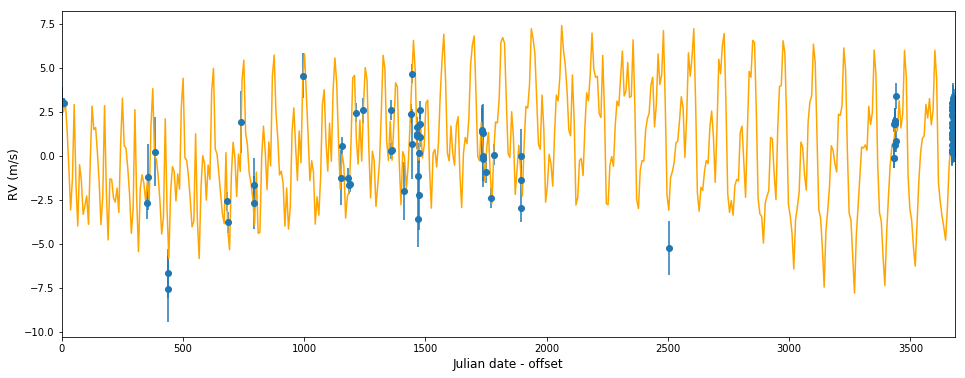

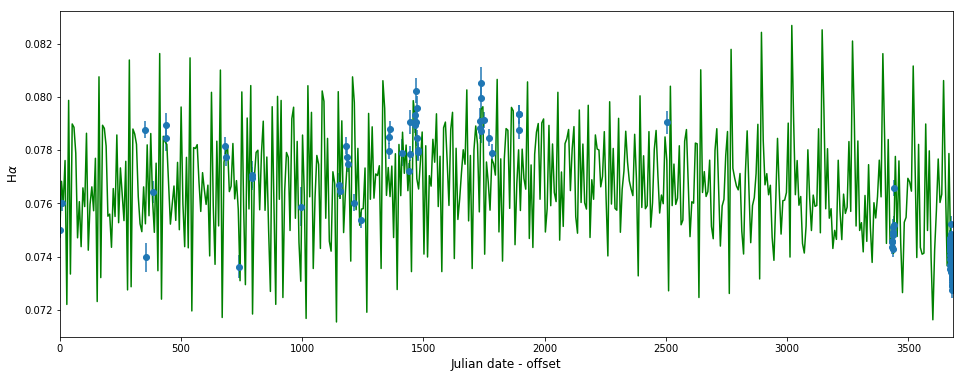

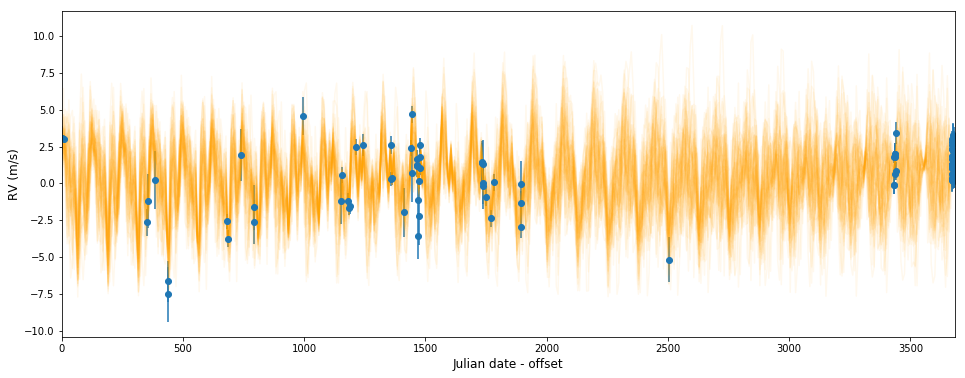

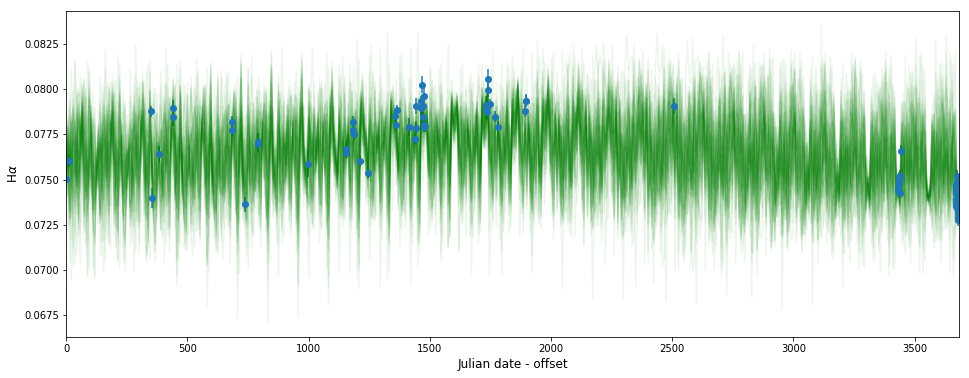

In [5]:
# Make a flat chain of samples with the initial burn-in discarded
samples = sampler.chain[:, nburn:, :].reshape((-1, ndim))

# Plot 50 possible RV curves drawn from the flat chain, along with the data
tt = np.linspace(alldates[0], alldates[-1], 501, endpoint=True)

fig1, (singleRV) = plt.subplots(1,figsize=(16,6))
fig2, (singleha) = plt.subplots(1, figsize=(16,6))
fig3, (RV) = plt.subplots(1, figsize=(16,6))
fig4, (ha) = plt.subplots(1, figsize=(16,6))

for i in range(nwalkers):
    # Choose a sample
    n = np.random.randint(0, samples.shape[0])
    spars_RV, spars_ha = split_par_vec(samples[n])
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    if(i == 0):
        singleRV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange")
        singleha.plot(tt, gp_ha.sample_conditional(allha, tt), "green")   
    # Plot a single sample.
    RV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange", alpha=0.07)
    ha.plot(tt, gp_ha.sample_conditional(allha, tt), "green", alpha=0.07)
    
# Plot the real data
singleRV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
singleha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
RV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
ha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
singleRV.set_xlim(alldates[0], alldates[-1])
singleha.set_xlim(alldates[0], alldates[-1])
RV.set_xlim(alldates[0], alldates[-1])
ha.set_xlim(alldates[0], alldates[-1])

singleRV.set_xlabel("Julian date - offset", fontsize='large')
singleha.set_xlabel("Julian date - offset", fontsize='large')
RV.set_xlabel("Julian date - offset", fontsize='large')
ha.set_xlabel("Julian date - offset", fontsize='large')
singleRV.set_ylabel("RV (m/s)", fontsize='large')
singleha.set_ylabel(r"H$\alpha$", fontsize='large')
RV.set_ylabel("RV (m/s)", fontsize='large')
ha.set_ylabel(r"H$\alpha$", fontsize='large')

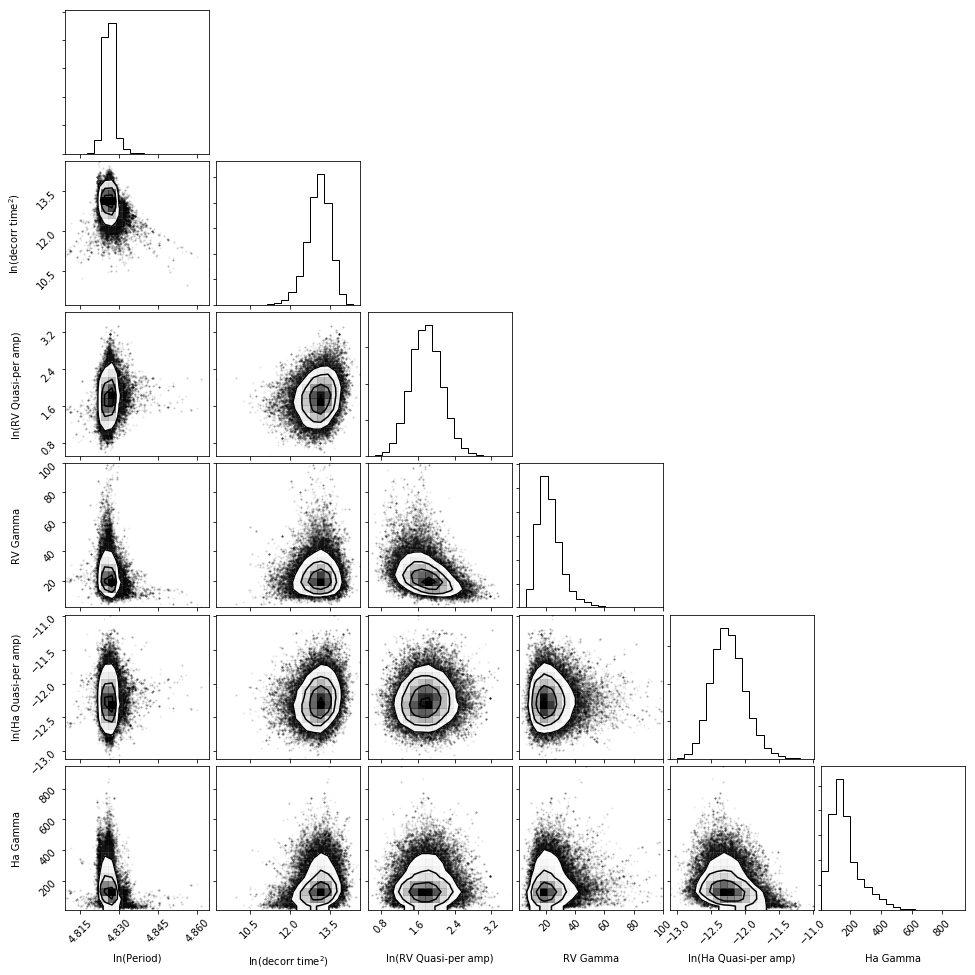

In [6]:
import corner
parnames = ["ln(Period)", "ln(decorr time$^2$)", "ln(RV Quasi-per amp)", \
            "RV Gamma", "ln(Ha Quasi-per amp)", "Ha Gamma"]
cfig = corner.corner(samples, labels=parnames)

## Period and decorrellation timescale

Text(0,0.5,'Fraction of samples')

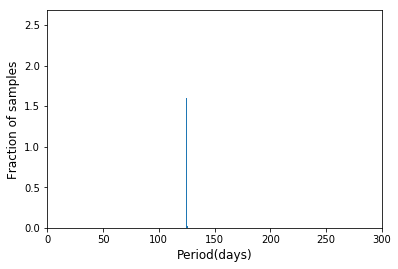

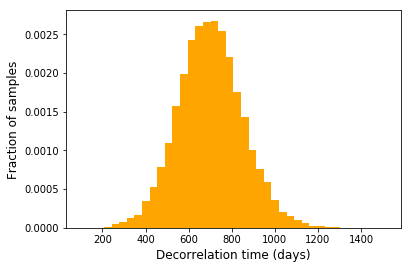

In [7]:
# Plots
plt.figure()
###Made a change here with adding 500. Sme below
periods = np.exp(samples[:,0])
dctimes = np.exp(0.5*samples[:,1])
n_per, bins_per, _ = plt.hist(periods, 1000, density=True)
plt.xlabel("Period(days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')
plt.xlim([0,300])
##plt.ylim([0,0.07])
plt.figure()
n_dc, bins_dc, _ = plt.hist(dctimes, 40, density=True, facecolor='orange')
plt.xlabel("Decorrelation time (days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')



## Residuals

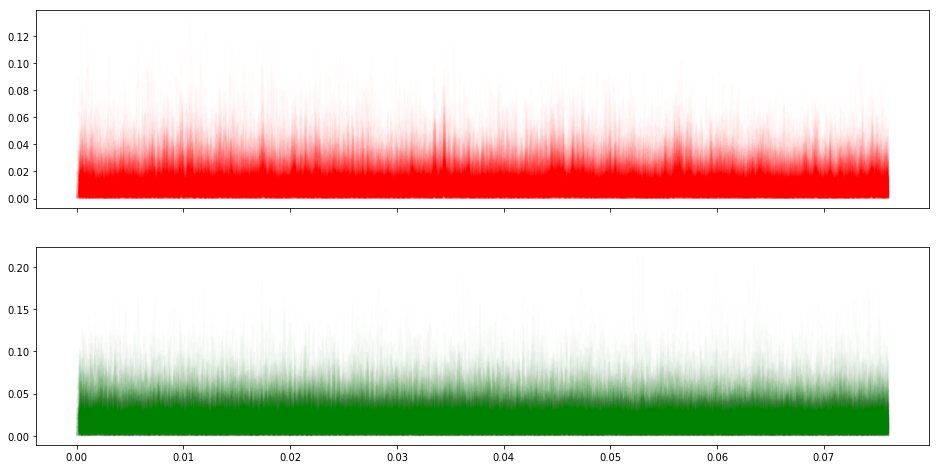

In [8]:
# ##Creating residual plots FIGURE THIS OUT!!
fig5, (ax5, ax6) = plt.subplots(2, sharex=True, figsize=(16,8))
pdsRV = np.zeros(500)
pdsHa = np.zeros(500)

for j in range(500):
    # Choose a sample
    m = np.random.randint(0, (samples.shape[0]))
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    
    #get residuals
    
    residRV = allRV - gp_RV.sample_conditional(allRV, alldates) 
    residHa = allha - gp_ha.sample_conditional(allha, alldates)
                
    #periodogram
    xiRV, pspecRV = LombScargle(alldates, residRV, allRVerr).autopower()
    xiha, pspecha = LombScargle(alldates, residHa, allhaerr).autopower()

    subRV = np.argmax(pspecRV)
    pdsRV[j] = 1.0/xiRV[subRV]
    subHa = np.argmax(pspecha)
    pdsHa[j] = 1.0/xiha[subHa]
    
    ax5.plot(xiRV, pspecRV, 'r-', alpha=0.01)
    ax6.plot(xiha, pspecha, 'g-', alpha=0.01)


##ax3.set_xlim(alldates[-1], alldates[111])
##ax4.set_xlim(alldates[-1], alldates[111])

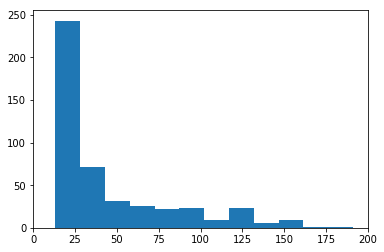

RV residual:  ModeResult(mode=array([13.4136824]), count=array([6]))


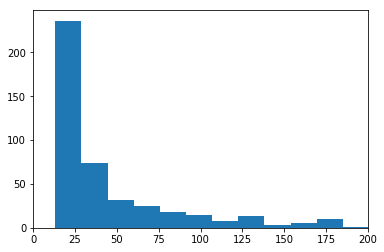

Ha residual:  ModeResult(mode=array([721.9717294]), count=array([6]))


In [9]:
from scipy import stats

plt.hist(pdsRV, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("RV residual: ", stats.mode(pdsRV))
plt.hist(pdsHa, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("Ha residual: ", stats.mode(pdsHa))

# Powell Method

## Set up gaussian process for Quasiperiodic Model

In [10]:
# To install george: $ conda install -c conda-forge george
# Most of this code is borrowed from a tutorial in the george documentation:
# https://george.readthedocs.io/en/latest/tutorials/hyper/
from george import kernels
from george import GP
from george import modeling
from scipy.optimize import minimize
from scipy.optimize import Bounds

# Quasi-periodic kernels
constant_guess_RV = 10. # Amplitudes of squared-exponential decorrelation kernels
constant_guess_ha = 4.0e-5
gamma_guess_RV = 5. # Amplitudes of periodic part of kernels
gamma_guess_ha = 10.
metric_guess = 100000. # Decorrelation timescale SQUARED (days)
period_guess = 120. # Best-fit period from GP model of RV alone

# Create the kernels
kexp2_RV = constant_guess_RV * kernels.ExpSquaredKernel(metric=metric_guess)
kexp2_ha = constant_guess_ha * kernels.ExpSquaredKernel(metric=metric_guess)

kper_RV = kernels.ExpSine2Kernel(gamma=gamma_guess_RV, log_period=np.log(period_guess))
kper_ha = kernels.ExpSine2Kernel(gamma=gamma_guess_ha, log_period=np.log(period_guess))

krot_RV = kexp2_RV * kper_RV
krot_ha = kexp2_ha * kper_ha

# Initialize the Gaussian processes 
gp_RV = GP(krot_RV, fit_kernel=True, mean=np.mean(allRV))##, \
        ##white_noise=modeling.CallableModel(whitenoise_RV, gradient=None))
gp_ha = GP(krot_ha, fit_kernel=True, mean=np.mean(allha))##, \
          ##white_noise=modeling.CallableModel(whitenoise_ha, gradient=None))

# Set reasonable boundaries for each hyperparameter
# Bounds order is same as parameter order: period, metric, 2
# RV exp2 amplitude, RV gamma, ha exp2 amplitude, ha gamma,
# ha long-term amplitude, ha long-term metric
##original: lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
##NEW ONES [4.,8.,.....]
##adjusting lower bounds
lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
upper_bounds = [10., 18., 6., 100., 0., 1000]

# Create a Bounds object that will restrict minimize to values within
# the boundaries
par_bounds = Bounds(lower_bounds, upper_bounds)
    
# You need to compute both GPs before starting the optimization.
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates, allhaerr)

# Combine the parameter vectors for both Gaussian processes into
# one (objective function sent to minimize must have only one
# input vector)
RV_pars = gp_RV.get_parameter_vector()
ha_pars = gp_ha.get_parameter_vector()
allpars = make_par_vec(RV_pars, ha_pars)

print("Master parameter vector:", allpars)
# Print the initial ln-likelihood
print("Initial ln-likelihood:", -nll(allpars))

# Run the optimization routine. I DON'T THINK USING george's 
# GRAD_LOG_LIKELIHOOD FUNCTION WILL WORK HERE BECAUSE PERIOD AND 
# DECORRELATION TIMESCALE WILL HAVE DIFFERENT GRADIENTS IN THE 
# HALPHA AND RV PARAMETER SETS.
# results = minimize(nll, allpars, jac=grad_nll, method="L-BFGS-B")
##Potentially use method='emcee'? Using same montecarlo method as is used by acutal emcee runs?
results = minimize(nll, allpars, method="Powell", bounds=par_bounds, \
                   options={'maxiter':3000, 'ftol':1.0e-8, 'xtol':1.0e-9, \
                           'gtol':1.0e-8})


# Update the kernels, print the final log-likelihood and results
results_RV, results_ha = split_par_vec(results.x)
final_loglike = -nll(results.x)
npts = len(alldates)
npars = len(allpars)
bic = np.log(npts) * npars - 2.*final_loglike
print("Final ln-likelihood:", final_loglike)
print("Results:",results)
gp_RV.set_parameter_vector(results_RV)
gp_ha.set_parameter_vector(results_ha)

print("\n")

print("Period: %4.2f days" % np.exp(results.x[0]), '\n')
print("Metric: %8.2f days squared" % np.exp(results.x[1]))
print("Decorrelation timescale (sqrt of metric): % 8.2f days" % np.sqrt(np.exp(results.x[1])), '\n')
print("Constant RV kernel multiplier: % 3.2f" % np.exp(results.x[2]))
print("Sqrt of constant RV kernel multiplier (physically meaningful): % 3.2f" % np.sqrt(np.exp(results.x[2])), '\n')
print("Gamma (multiplier of sin2) for RV: % 3.2f" % results.x[3])
print("Roughness parameter omega for RV: % 3.2f" % np.sqrt(0.5/results.x[3]), '\n')
print("Constant Halpha quasiperiodic kernel multiplier: % 0.7f" % np.exp(results.x[4]))
print("Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): %0.7f" % np.sqrt(np.exp(results.x[4])), '\n')
print("Gamma (multiplier of sin2) for Halpha: % 3.3f" % results.x[5])
print("Roughness parameter omega for Halpha: % 3.3f" % np.sqrt(0.5/results.x[5]), '\n')


Master parameter vector: [4.787491742782046, 11.512925464970229, 2.302585092994046, 5.0, -10.126631103850338, 10.0]
Initial ln-likelihood: 413.7361239551002


/Users/student/anaconda3/lib/python3.6/site-packages/scipy/optimize/_minimize.py:518: RuntimeWarning: Method Powell cannot handle constraints nor bounds.
  RuntimeWarning)
/Users/student/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:69: OptimizeWarning: Unknown solver options: gtol


Final ln-likelihood: 438.50426970621055
Results:    direc: array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  1.00000000e+00],
       [ 0.00000000e+00,  1.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  1.00000000e+00,  0.00000000e+00],
       [-6.70018994e-03,  4.58219748e-01, -3.61081143e-01,
         3.43775179e+00, -2.82905796e-01,  1.23549759e+01]])
     fun: -438.50426970621055
 message: 'Optimization terminated successfully.'
    nfev: 1074
     nit: 8
  status: 0
 success: True
       x: array([  4.82614576,  13.25623265,   1.84584482,  19.33777339,
       -12.28822061

## Sample Gaussian Process

In [11]:
# The same boundaries used in minimize will define the edges of uniform
# prior windows
def lnprior(pars):
    for i in range(len(pars)):
        if ((pars[i] < lower_bounds[i]) or (pars[i] > upper_bounds[i])):
            return -np.inf
    return 0.

# The full log-probability function, including priors
def lnprob(pars):
    ll = -nll(pars)
    lp = lnprior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + ll

# Run the Gaussian processes again
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates,allhaerr)
print("Computed the Gaussian processes")

# Set up the sampler.
nwalkers, ndim = 50, len(allpars)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob)

# Initialize the walkers.
pstart = results.x
p0 = pstart + 1.0e-4 * np.random.randn(nwalkers, ndim)
# Use smaller starting distribution in parameter space for tiny numbers: 
# constants multiplying the Halpha exp2 kernels
p0[:,4] = pstart[4] + 3.0e-7 * np.random.randn(nwalkers)


##Increased both burn in and nproduce
print("Running burn-in")
nburn = 500
p0, _, _ = sampler.run_mcmc(p0, nburn)

print("Running production chain")
nproduce = 2000
sampler.run_mcmc(p0, nproduce)

print("Mean acceptance fraction: {0:.3f}".format(np.mean(sampler.acceptance_fraction)))

Computed the Gaussian processes
Running burn-in
Running production chain
Mean acceptance fraction: 0.480


## Graphs



corner plot




histograms of period and decorellation time


Text(0,0.5,'Fraction of samples')

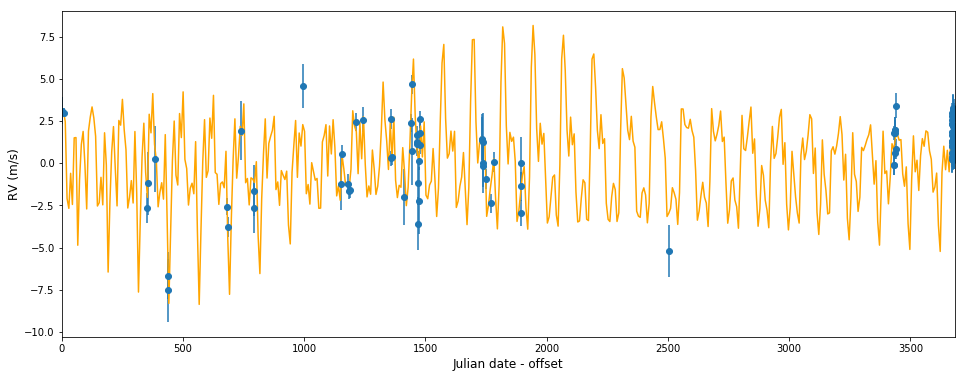

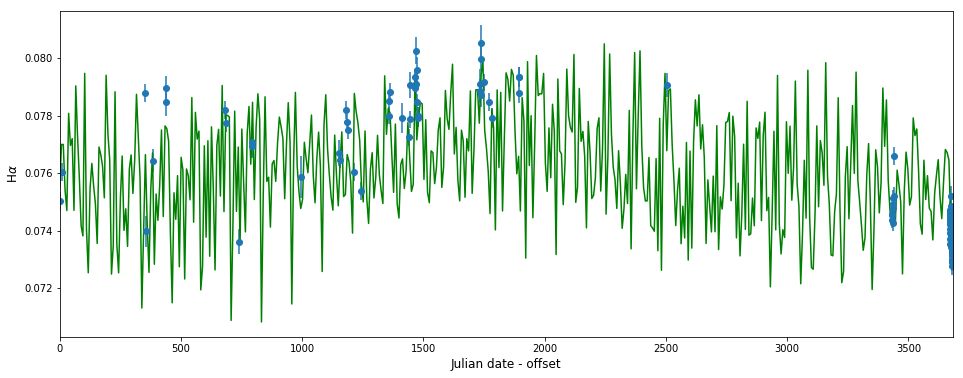

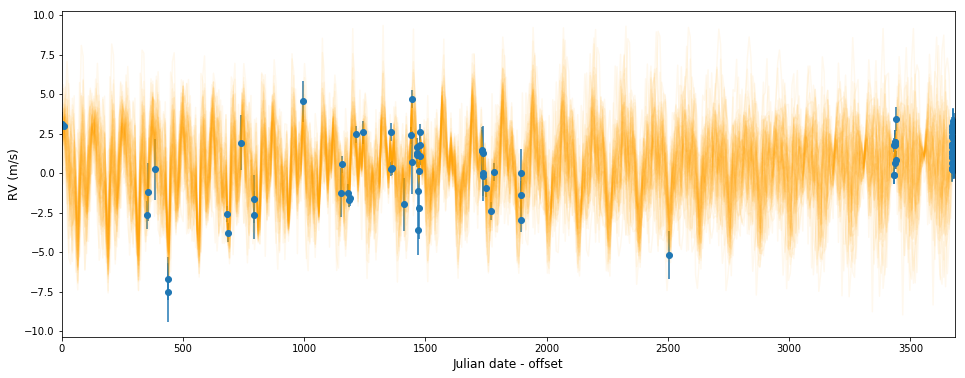

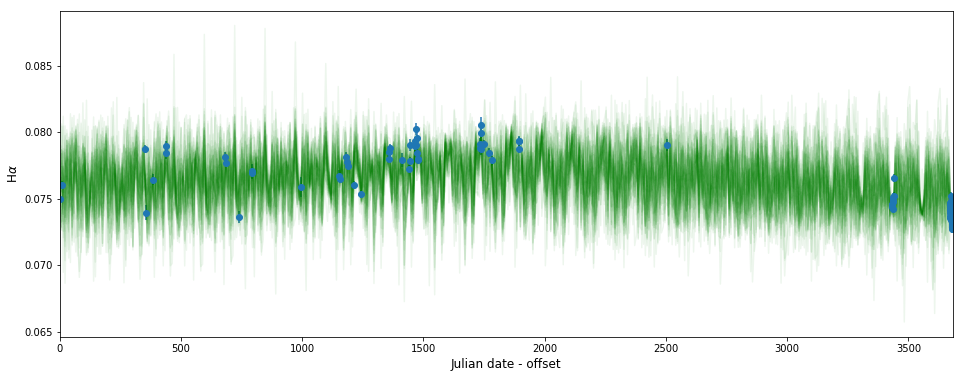

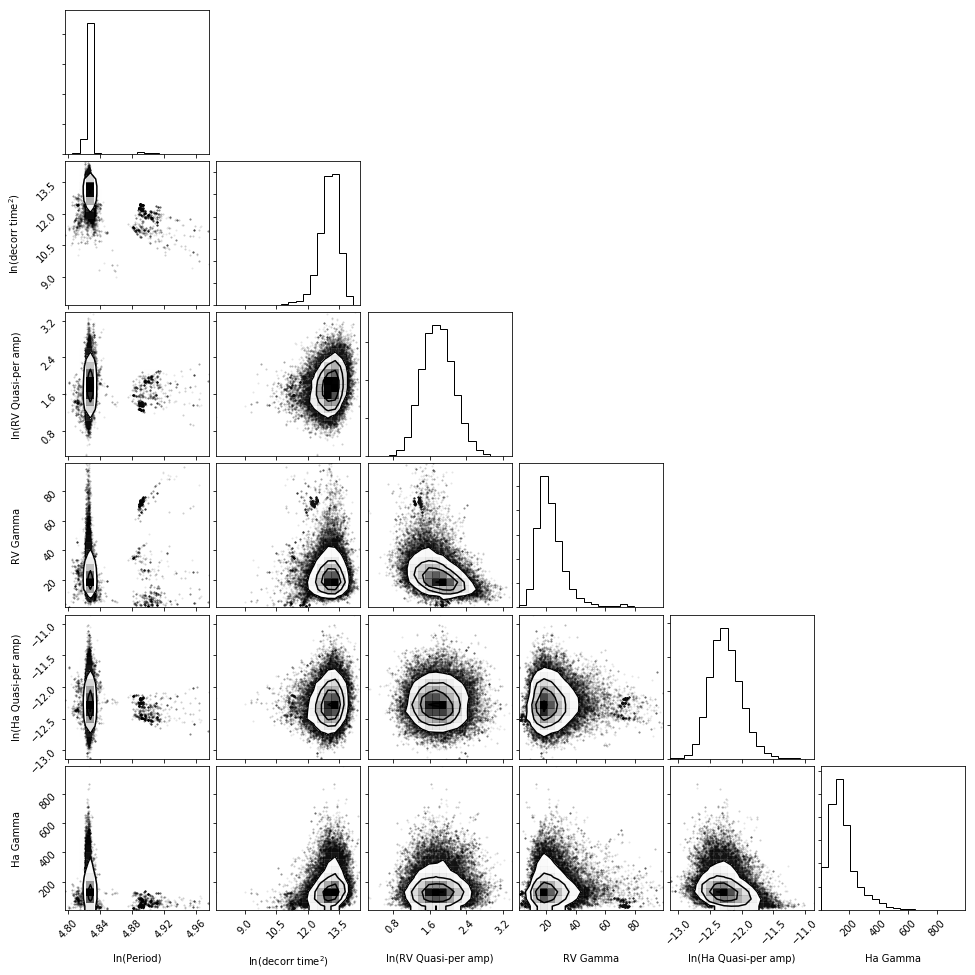

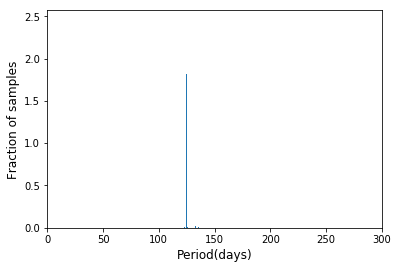

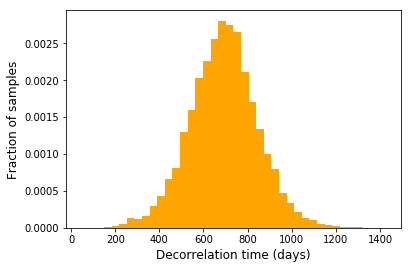

In [12]:
# Make a flat chain of samples with the initial burn-in discarded
samples = sampler.chain[:, nburn:, :].reshape((-1, ndim))

# Plot 50 possible RV curves drawn from the flat chain, along with the data
tt = np.linspace(alldates[0], alldates[-1], 501, endpoint=True)

fig1, (singleRV) = plt.subplots(1,figsize=(16,6))
fig2, (singleha) = plt.subplots(1, figsize=(16,6))
fig3, (RV) = plt.subplots(1, figsize=(16,6))
fig4, (ha) = plt.subplots(1, figsize=(16,6))

for i in range(nwalkers):
    # Choose a sample
    n = np.random.randint(0, samples.shape[0])
    spars_RV, spars_ha = split_par_vec(samples[n])
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    if(i == 0):
        singleRV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange")
        singleha.plot(tt, gp_ha.sample_conditional(allha, tt), "green")   
    # Plot a single sample.
    RV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange", alpha=0.07)
    ha.plot(tt, gp_ha.sample_conditional(allha, tt), "green", alpha=0.07)
    
# Plot the real data
singleRV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
singleha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
RV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
ha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
singleRV.set_xlim(alldates[0], alldates[-1])
singleha.set_xlim(alldates[0], alldates[-1])
RV.set_xlim(alldates[0], alldates[-1])
ha.set_xlim(alldates[0], alldates[-1])

singleRV.set_xlabel("Julian date - offset", fontsize='large')
singleha.set_xlabel("Julian date - offset", fontsize='large')
RV.set_xlabel("Julian date - offset", fontsize='large')
ha.set_xlabel("Julian date - offset", fontsize='large')
singleRV.set_ylabel("RV (m/s)", fontsize='large')
singleha.set_ylabel(r"H$\alpha$", fontsize='large')
RV.set_ylabel("RV (m/s)", fontsize='large')
ha.set_ylabel(r"H$\alpha$", fontsize='large')

print("\n")
print("corner plot")

parnames = ["ln(Period)", "ln(decorr time$^2$)", "ln(RV Quasi-per amp)", \
            "RV Gamma", "ln(Ha Quasi-per amp)", "Ha Gamma"]
cfig = corner.corner(samples, labels=parnames)

print("\n")
print("histograms of period and decorellation time")

# Plots
plt.figure()
###Made a change here with adding 500. Sme below
periods = np.exp(samples[:,0])
dctimes = np.exp(0.5*samples[:,1])
n_per, bins_per, _ = plt.hist(periods, 1000, density=True)
plt.xlabel("Period(days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')
plt.xlim([0,300])
##plt.ylim([0,0.07])
plt.figure()
n_dc, bins_dc, _ = plt.hist(dctimes, 40, density=True, facecolor='orange')
plt.xlabel("Decorrelation time (days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')

## Residuals

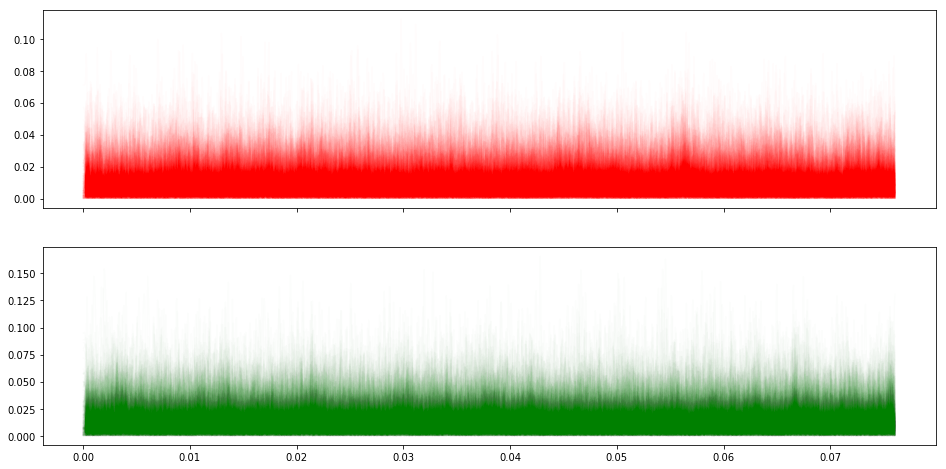

In [13]:
# ##Creating residual plots FIGURE THIS OUT!!
fig5, (ax5, ax6) = plt.subplots(2, sharex=True, figsize=(16,8))
pdsRV = np.zeros(500)
pdsHa = np.zeros(500)

for j in range(500):
    # Choose a sample
    m = np.random.randint(0, (samples.shape[0]))
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    
    #get residuals
    
    residRV = allRV - gp_RV.sample_conditional(allRV, alldates) 
    residHa = allha - gp_ha.sample_conditional(allha, alldates)
                
    #periodogram
    xiRV, pspecRV = LombScargle(alldates, residRV, allRVerr).autopower()
    xiha, pspecha = LombScargle(alldates, residHa, allhaerr).autopower()

    subRV = np.argmax(pspecRV)
    pdsRV[j] = 1.0/xiRV[subRV]
    subHa = np.argmax(pspecha)
    pdsHa[j] = 1.0/xiha[subHa]
    
    ax5.plot(xiRV, pspecRV, 'r-', alpha=0.01)
    ax6.plot(xiha, pspecha, 'g-', alpha=0.01)

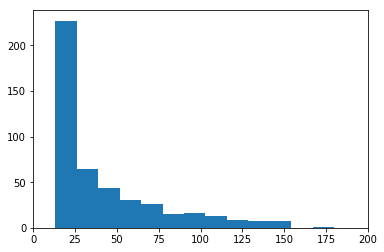

RV residual:  ModeResult(mode=array([30.6072803]), count=array([4]))


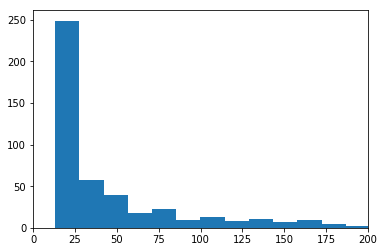

Ha residual:  ModeResult(mode=array([247.11784026]), count=array([5]))


In [14]:
from scipy import stats

plt.hist(pdsRV, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("RV residual: ", stats.mode(pdsRV))
plt.hist(pdsHa, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("Ha residual: ", stats.mode(pdsHa))

# COBYLA Method

## Set up gaussian process

In [15]:
# To install george: $ conda install -c conda-forge george
# Most of this code is borrowed from a tutorial in the george documentation:
# https://george.readthedocs.io/en/latest/tutorials/hyper/
from george import kernels
from george import GP
from george import modeling
from scipy.optimize import minimize
from scipy.optimize import Bounds

# Quasi-periodic kernels
constant_guess_RV = 10. # Amplitudes of squared-exponential decorrelation kernels
constant_guess_ha = 4.0e-5
gamma_guess_RV = 5. # Amplitudes of periodic part of kernels
gamma_guess_ha = 10.
metric_guess = 100000. # Decorrelation timescale SQUARED (days)
period_guess = 120. # Best-fit period from GP model of RV alone

# Create the kernels
kexp2_RV = constant_guess_RV * kernels.ExpSquaredKernel(metric=metric_guess)
kexp2_ha = constant_guess_ha * kernels.ExpSquaredKernel(metric=metric_guess)

kper_RV = kernels.ExpSine2Kernel(gamma=gamma_guess_RV, log_period=np.log(period_guess))
kper_ha = kernels.ExpSine2Kernel(gamma=gamma_guess_ha, log_period=np.log(period_guess))

krot_RV = kexp2_RV * kper_RV
krot_ha = kexp2_ha * kper_ha

# Initialize the Gaussian processes 
gp_RV = GP(krot_RV, fit_kernel=True, mean=np.mean(allRV))##, \
        ##white_noise=modeling.CallableModel(whitenoise_RV, gradient=None))
gp_ha = GP(krot_ha, fit_kernel=True, mean=np.mean(allha))##, \
          ##white_noise=modeling.CallableModel(whitenoise_ha, gradient=None))

# Set reasonable boundaries for each hyperparameter
# Bounds order is same as parameter order: period, metric, 
# RV exp2 amplitude, RV gamma, ha exp2 amplitude, ha gamma,
# ha long-term amplitude, ha long-term metric
##original: lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
##NEW ONES [4.,8.,.....]
##adjusting lower bounds
lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
upper_bounds = [10., 18., 6., 100., 0., 1000]

# Create a Bounds object that will restrict minimize to values within
# the boundaries
par_bounds = Bounds(lower_bounds, upper_bounds)
    
# You need to compute both GPs before starting the optimization.
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates, allhaerr)

# Combine the parameter vectors for both Gaussian processes into
# one (objective function sent to minimize must have only one
# input vector)
RV_pars = gp_RV.get_parameter_vector()
ha_pars = gp_ha.get_parameter_vector()
allpars = make_par_vec(RV_pars, ha_pars)

print("Master parameter vector:", allpars)
# Print the initial ln-likelihood
print("Initial ln-likelihood:", -nll(allpars))

# Run the optimization routine. I DON'T THINK USING george's 
# GRAD_LOG_LIKELIHOOD FUNCTION WILL WORK HERE BECAUSE PERIOD AND 
# DECORRELATION TIMESCALE WILL HAVE DIFFERENT GRADIENTS IN THE 
# HALPHA AND RV PARAMETER SETS.
# results = minimize(nll, allpars, jac=grad_nll, method="L-BFGS-B")
##Potentially use method='emcee'? Using same montecarlo method as is used by acutal emcee runs?
results = minimize(nll, allpars, method="COBYLA", bounds=par_bounds, \
                   options={'maxiter':3000, 'ftol':1.0e-8, 'xtol':1.0e-9, \
                           'gtol':1.0e-8})


# Update the kernels, print the final log-likelihood and results
results_RV, results_ha = split_par_vec(results.x)
final_loglike = -nll(results.x)
npts = len(alldates)
npars = len(allpars)
bic = np.log(npts) * npars - 2.*final_loglike
print("Final ln-likelihood:", final_loglike)
print("Results:",results)
gp_RV.set_parameter_vector(results_RV)
gp_ha.set_parameter_vector(results_ha)

print("\n")

print("Period: %4.2f days" % np.exp(results.x[0]), '\n')
print("Metric: %8.2f days squared" % np.exp(results.x[1]))
print("Decorrelation timescale (sqrt of metric): % 8.2f days" % np.sqrt(np.exp(results.x[1])), '\n')
print("Constant RV kernel multiplier: % 3.2f" % np.exp(results.x[2]))
print("Sqrt of constant RV kernel multiplier (physically meaningful): % 3.2f" % np.sqrt(np.exp(results.x[2])), '\n')
print("Gamma (multiplier of sin2) for RV: % 3.2f" % results.x[3])
print("Roughness parameter omega for RV: % 3.2f" % np.sqrt(0.5/results.x[3]), '\n')
print("Constant Halpha quasiperiodic kernel multiplier: % 0.7f" % np.exp(results.x[4]))
print("Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): %0.7f" % np.sqrt(np.exp(results.x[4])), '\n')
print("Gamma (multiplier of sin2) for Halpha: % 3.3f" % results.x[5])
print("Roughness parameter omega for Halpha: % 3.3f" % np.sqrt(0.5/results.x[5]), '\n')



Master parameter vector: [4.787491742782046, 11.512925464970229, 2.302585092994046, 5.0, -10.126631103850338, 10.0]
Initial ln-likelihood: 413.7361239551002


/Users/student/anaconda3/lib/python3.6/site-packages/scipy/optimize/_minimize.py:524: RuntimeWarning: Method COBYLA cannot handle bounds.
  RuntimeWarning)
/Users/student/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:69: OptimizeWarning: Unknown solver options: ftol, xtol, gtol


Final ln-likelihood: 424.78888739227335
Results:      fun: -424.78888739227335
   maxcv: 0.0
 message: 'Maximum number of function evaluations has been exceeded.'
    nfev: 3000
  status: 2
 success: False
       x: array([  4.80391607,  11.23360807,   1.80475696,   4.74609735,
       -11.57073428,  10.09716756])


Period: 121.99 days 

Metric: 75629.98 days squared
Decorrelation timescale (sqrt of metric):   275.01 days 

Constant RV kernel multiplier:  6.08
Sqrt of constant RV kernel multiplier (physically meaningful):  2.47 

Gamma (multiplier of sin2) for RV:  4.75
Roughness parameter omega for RV:  0.32 

Constant Halpha quasiperiodic kernel multiplier:  0.0000094
Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): 0.0030722 

Gamma (multiplier of sin2) for Halpha:  10.097
Roughness parameter omega for Halpha:  0.223 



## Sample GP

In [16]:
# The same boundaries used in minimize will define the edges of uniform
# prior windows
def lnprior(pars):
    for i in range(len(pars)):
        if ((pars[i] < lower_bounds[i]) or (pars[i] > upper_bounds[i])):
            return -np.inf
    return 0.

# The full log-probability function, including priors
def lnprob(pars):
    ll = -nll(pars)
    lp = lnprior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + ll

# Run the Gaussian processes again
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates,allhaerr)
print("Computed the Gaussian processes")

# Set up the sampler.
nwalkers, ndim = 50, len(allpars)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob)

# Initialize the walkers.
pstart = results.x
p0 = pstart + 1.0e-4 * np.random.randn(nwalkers, ndim)
# Use smaller starting distribution in parameter space for tiny numbers: 
# constants multiplying the Halpha exp2 kernels
p0[:,4] = pstart[4] + 3.0e-7 * np.random.randn(nwalkers)


##Increased both burn in and nproduce
print("Running burn-in")
nburn = 500
p0, _, _ = sampler.run_mcmc(p0, nburn)

print("Running production chain")
nproduce = 2000
sampler.run_mcmc(p0, nproduce)

print("Mean acceptance fraction: {0:.3f}".format(np.mean(sampler.acceptance_fraction)))

Computed the Gaussian processes
Running burn-in
Running production chain
Mean acceptance fraction: 0.275


## Graphs



corner plot


histograms of period and decorellation time


Text(0,0.5,'Fraction of samples')

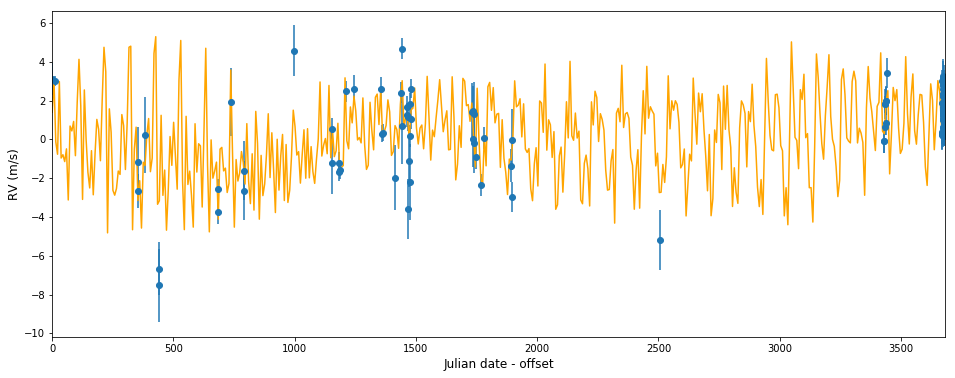

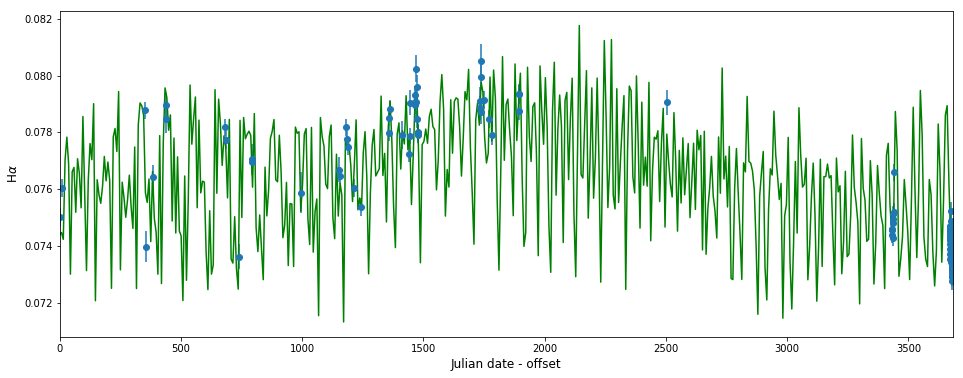

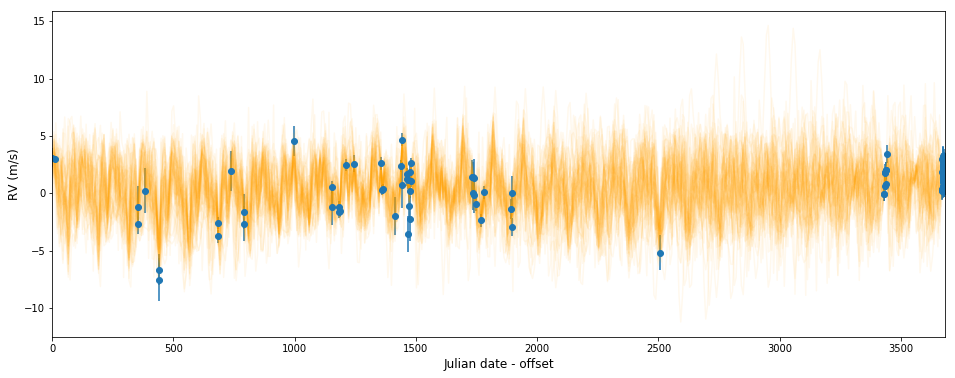

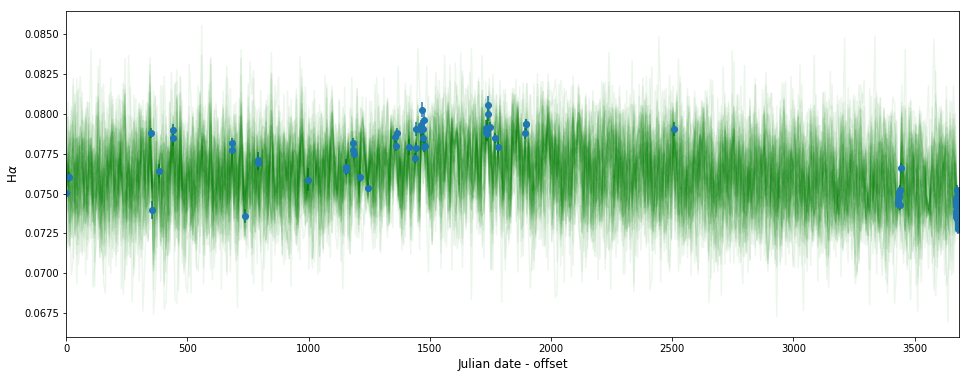

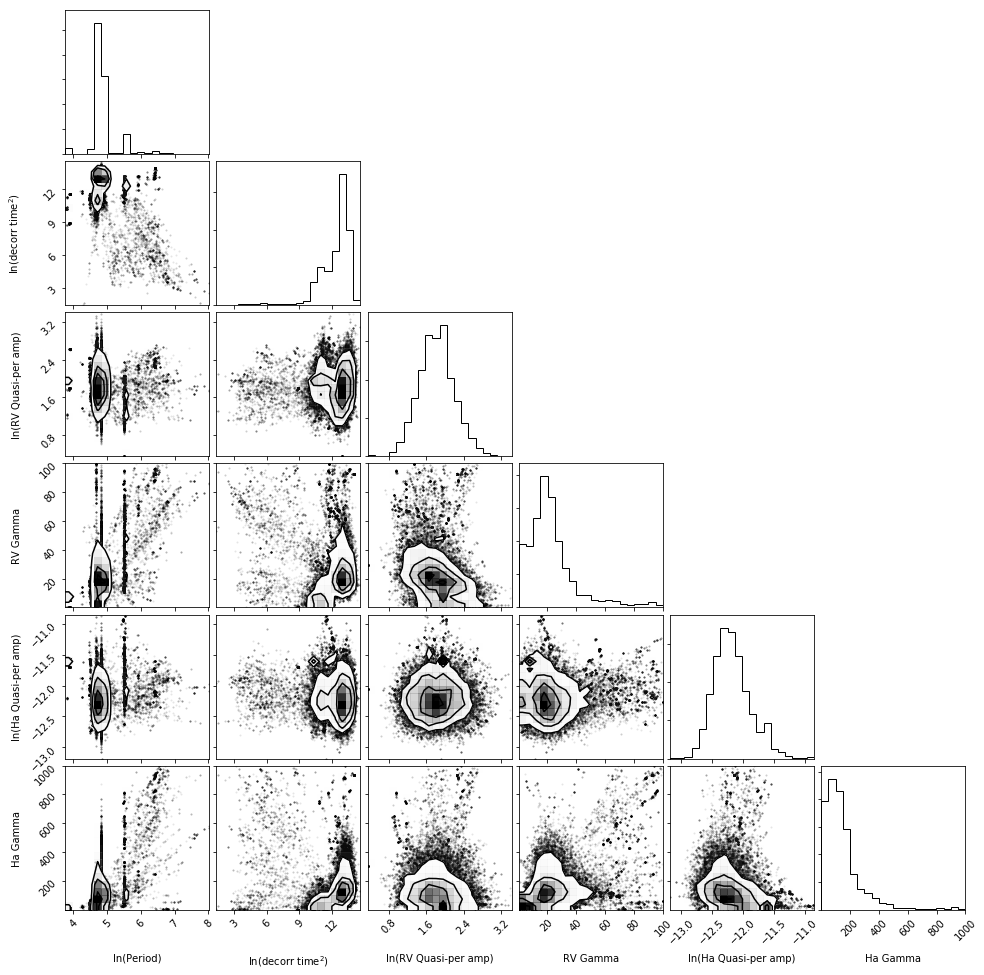

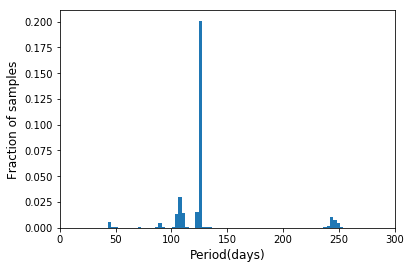

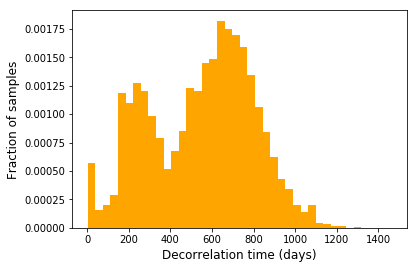

In [17]:
# Make a flat chain of samples with the initial burn-in discarded
samples = sampler.chain[:, nburn:, :].reshape((-1, ndim))

# Plot 50 possible RV curves drawn from the flat chain, along with the data
tt = np.linspace(alldates[0], alldates[-1], 501, endpoint=True)

fig1, (singleRV) = plt.subplots(1,figsize=(16,6))
fig2, (singleha) = plt.subplots(1, figsize=(16,6))
fig3, (RV) = plt.subplots(1, figsize=(16,6))
fig4, (ha) = plt.subplots(1, figsize=(16,6))

for i in range(nwalkers):
    # Choose a sample
    n = np.random.randint(0, samples.shape[0])
    spars_RV, spars_ha = split_par_vec(samples[n])
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    if(i == 0):
        singleRV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange")
        singleha.plot(tt, gp_ha.sample_conditional(allha, tt), "green")   
    # Plot a single sample.
    RV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange", alpha=0.07)
    ha.plot(tt, gp_ha.sample_conditional(allha, tt), "green", alpha=0.07)
    
# Plot the real data
singleRV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
singleha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
RV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
ha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
singleRV.set_xlim(alldates[0], alldates[-1])
singleha.set_xlim(alldates[0], alldates[-1])
RV.set_xlim(alldates[0], alldates[-1])
ha.set_xlim(alldates[0], alldates[-1])

singleRV.set_xlabel("Julian date - offset", fontsize='large')
singleha.set_xlabel("Julian date - offset", fontsize='large')
RV.set_xlabel("Julian date - offset", fontsize='large')
ha.set_xlabel("Julian date - offset", fontsize='large')
singleRV.set_ylabel("RV (m/s)", fontsize='large')
singleha.set_ylabel(r"H$\alpha$", fontsize='large')
RV.set_ylabel("RV (m/s)", fontsize='large')
ha.set_ylabel(r"H$\alpha$", fontsize='large')

print("\n")
print("corner plot")

parnames = ["ln(Period)", "ln(decorr time$^2$)", "ln(RV Quasi-per amp)", \
            "RV Gamma", "ln(Ha Quasi-per amp)", "Ha Gamma"]
cfig = corner.corner(samples, labels=parnames)

print("\n")
print("histograms of period and decorellation time")

# Plots
plt.figure()
###Made a change here with adding 500. Sme below
periods = np.exp(samples[:,0])
dctimes = np.exp(0.5*samples[:,1])
n_per, bins_per, _ = plt.hist(periods, 1000, density=True)
plt.xlabel("Period(days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')
plt.xlim([0,300])
##plt.ylim([0,0.07])
plt.figure()
n_dc, bins_dc, _ = plt.hist(dctimes, 40, density=True, facecolor='orange')
plt.xlabel("Decorrelation time (days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')

## Residuals

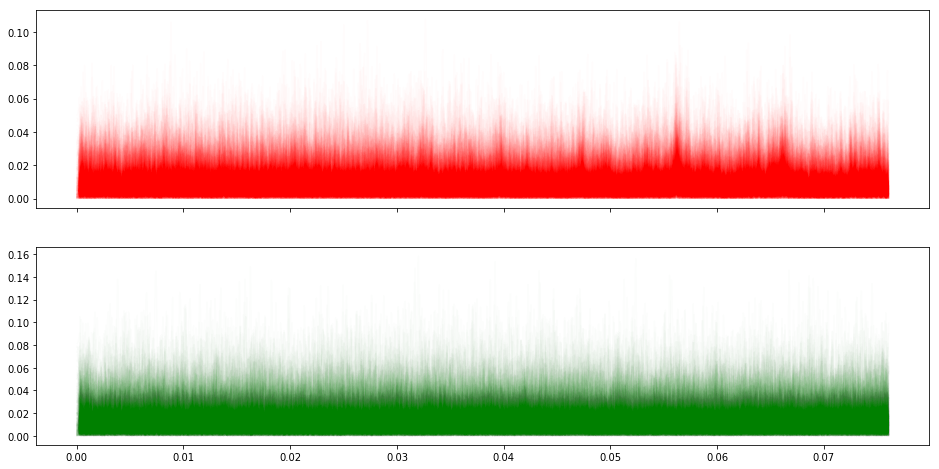

In [18]:
# ##Creating residual plots FIGURE THIS OUT!!
fig5, (ax5, ax6) = plt.subplots(2, sharex=True, figsize=(16,8))
pdsRV = np.zeros(500)
pdsHa = np.zeros(500)

for j in range(500):
    # Choose a sample
    m = np.random.randint(0, (samples.shape[0]))
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    
    #get residuals
    
    residRV = allRV - gp_RV.sample_conditional(allRV, alldates) 
    residHa = allha - gp_ha.sample_conditional(allha, alldates)
                
    #periodogram
    xiRV, pspecRV = LombScargle(alldates, residRV, allRVerr).autopower()
    xiha, pspecha = LombScargle(alldates, residHa, allhaerr).autopower()

    subRV = np.argmax(pspecRV)
    pdsRV[j] = 1.0/xiRV[subRV]
    subHa = np.argmax(pspecha)
    pdsHa[j] = 1.0/xiha[subHa]
    
    ax5.plot(xiRV, pspecRV, 'r-', alpha=0.01)
    ax6.plot(xiha, pspecha, 'g-', alpha=0.01)

## Histograms

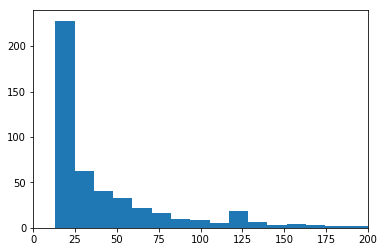

RV residual:  ModeResult(mode=array([17.79630652]), count=array([9]))


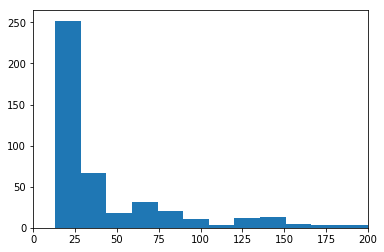

Ha residual:  ModeResult(mode=array([77.84473192]), count=array([4]))


In [19]:
plt.hist(pdsRV, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("RV residual: ", stats.mode(pdsRV))
plt.hist(pdsHa, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("Ha residual: ", stats.mode(pdsHa))

# TNC Method

## Initialize GP

In [20]:
# To install george: $ conda install -c conda-forge george
# Most of this code is borrowed from a tutorial in the george documentation:
# https://george.readthedocs.io/en/latest/tutorials/hyper/
from george import kernels
from george import GP
from george import modeling
from scipy.optimize import minimize
from scipy.optimize import Bounds

# Quasi-periodic kernels
constant_guess_RV = 10. # Amplitudes of squared-exponential decorrelation kernels
constant_guess_ha = 4.0e-5
gamma_guess_RV = 5. # Amplitudes of periodic part of kernels
gamma_guess_ha = 10.
metric_guess = 100000. # Decorrelation timescale SQUARED (days)
period_guess = 120. # Best-fit period from GP model of RV alone

# Create the kernels
kexp2_RV = constant_guess_RV * kernels.ExpSquaredKernel(metric=metric_guess)
kexp2_ha = constant_guess_ha * kernels.ExpSquaredKernel(metric=metric_guess)

kper_RV = kernels.ExpSine2Kernel(gamma=gamma_guess_RV, log_period=np.log(period_guess))
kper_ha = kernels.ExpSine2Kernel(gamma=gamma_guess_ha, log_period=np.log(period_guess))

krot_RV = kexp2_RV * kper_RV
krot_ha = kexp2_ha * kper_ha

# Initialize the Gaussian processes 
gp_RV = GP(krot_RV, fit_kernel=True, mean=np.mean(allRV))##, \
        ##white_noise=modeling.CallableModel(whitenoise_RV, gradient=None))
gp_ha = GP(krot_ha, fit_kernel=True, mean=np.mean(allha))##, \
          ##white_noise=modeling.CallableModel(whitenoise_ha, gradient=None))

# Set reasonable boundaries for each hyperparameter
# Bounds order is same as parameter order: period, metric, 
# RV exp2 amplitude, RV gamma, ha exp2 amplitude, ha gamma,
# ha long-term amplitude, ha long-term metric
##original: lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
##NEW ONES [4.,8.,.....]
##adjusting lower bounds
lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
upper_bounds = [10., 18., 6., 100., 0., 1000]

# Create a Bounds object that will restrict minimize to values within
# the boundaries
par_bounds = Bounds(lower_bounds, upper_bounds)
    
# You need to compute both GPs before starting the optimization.
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates, allhaerr)

# Combine the parameter vectors for both Gaussian processes into
# one (objective function sent to minimize must have only one
# input vector)
RV_pars = gp_RV.get_parameter_vector()
ha_pars = gp_ha.get_parameter_vector()
allpars = make_par_vec(RV_pars, ha_pars)

print("Master parameter vector:", allpars)
# Print the initial ln-likelihood
print("Initial ln-likelihood:", -nll(allpars))

# Run the optimization routine. I DON'T THINK USING george's 
# GRAD_LOG_LIKELIHOOD FUNCTION WILL WORK HERE BECAUSE PERIOD AND 
# DECORRELATION TIMESCALE WILL HAVE DIFFERENT GRADIENTS IN THE 
# HALPHA AND RV PARAMETER SETS.
# results = minimize(nll, allpars, jac=grad_nll, method="L-BFGS-B")
##Potentially use method='emcee'? Using same montecarlo method as is used by acutal emcee runs?
results = minimize(nll, allpars, method="TNC", bounds=par_bounds, \
                   options={'maxiter':3000, 'ftol':1.0e-8, 'xtol':1.0e-9, \
                           'gtol':1.0e-8})


# Update the kernels, print the final log-likelihood and results
results_RV, results_ha = split_par_vec(results.x)
final_loglike = -nll(results.x)
npts = len(alldates)
npars = len(allpars)
bic = np.log(npts) * npars - 2.*final_loglike
print("Final ln-likelihood:", final_loglike)
print("Results:",results)
gp_RV.set_parameter_vector(results_RV)
gp_ha.set_parameter_vector(results_ha)

print("\n")

print("Period: %4.2f days" % np.exp(results.x[0]), '\n')
print("Metric: %8.2f days squared" % np.exp(results.x[1]))
print("Decorrelation timescale (sqrt of metric): % 8.2f days" % np.sqrt(np.exp(results.x[1])), '\n')
print("Constant RV kernel multiplier: % 3.2f" % np.exp(results.x[2]))
print("Sqrt of constant RV kernel multiplier (physically meaningful): % 3.2f" % np.sqrt(np.exp(results.x[2])), '\n')
print("Gamma (multiplier of sin2) for RV: % 3.2f" % results.x[3])
print("Roughness parameter omega for RV: % 3.2f" % np.sqrt(0.5/results.x[3]), '\n')
print("Constant Halpha quasiperiodic kernel multiplier: % 0.7f" % np.exp(results.x[4]))
print("Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): %0.7f" % np.sqrt(np.exp(results.x[4])), '\n')
print("Gamma (multiplier of sin2) for Halpha: % 3.3f" % results.x[5])
print("Roughness parameter omega for Halpha: % 3.3f" % np.sqrt(0.5/results.x[5]), '\n')




Master parameter vector: [4.787491742782046, 11.512925464970229, 2.302585092994046, 5.0, -10.126631103850338, 10.0]
Initial ln-likelihood: 413.7361239551002
Final ln-likelihood: 425.7101199629679
Results:      fun: -425.7101199629679
     jac: array([ 6.50875904,  0.5447589 , -1.13881811, -0.75913249,  0.08250254,
       -0.45758952])
 message: 'Converged (|f_n-f_(n-1)| ~= 0)'
    nfev: 91
     nit: 12
  status: 1
 success: True
       x: array([  4.83677077,  11.52178153,   1.89772836,   4.69171571,
       -11.84521511,  10.57172759])


Period: 126.06 days 

Metric: 100889.54 days squared
Decorrelation timescale (sqrt of metric):   317.63 days 

Constant RV kernel multiplier:  6.67
Sqrt of constant RV kernel multiplier (physically meaningful):  2.58 

Gamma (multiplier of sin2) for RV:  4.69
Roughness parameter omega for RV:  0.33 

Constant Halpha quasiperiodic kernel multiplier:  0.0000072
Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): 0.0026782 

G

## Sample GP

In [21]:
# The same boundaries used in minimize will define the edges of uniform
# prior windows
def lnprior(pars):
    for i in range(len(pars)):
        if ((pars[i] < lower_bounds[i]) or (pars[i] > upper_bounds[i])):
            return -np.inf
    return 0.

# The full log-probability function, including priors
def lnprob(pars):
    ll = -nll(pars)
    lp = lnprior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + ll

# Run the Gaussian processes again
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates,allhaerr)
print("Computed the Gaussian processes")

# Set up the sampler.
nwalkers, ndim = 50, len(allpars)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob)

# Initialize the walkers.
pstart = results.x
p0 = pstart + 1.0e-4 * np.random.randn(nwalkers, ndim)
# Use smaller starting distribution in parameter space for tiny numbers: 
# constants multiplying the Halpha exp2 kernels
p0[:,4] = pstart[4] + 3.0e-7 * np.random.randn(nwalkers)


##Increased both burn in and nproduce
print("Running burn-in")
nburn = 500
p0, _, _ = sampler.run_mcmc(p0, nburn)

print("Running production chain")
nproduce = 2000
sampler.run_mcmc(p0, nproduce)

print("Mean acceptance fraction: {0:.3f}".format(np.mean(sampler.acceptance_fraction)))

Computed the Gaussian processes
Running burn-in
Running production chain
Mean acceptance fraction: 0.297


## Graphs

Text(0,0.5,'Fraction of samples')

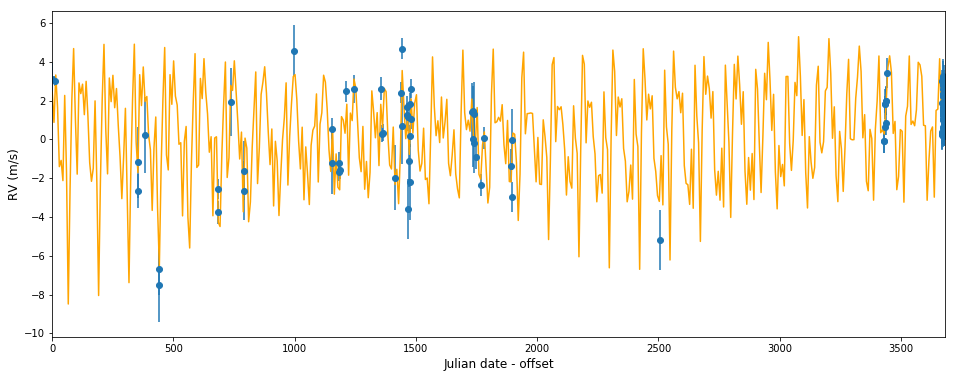

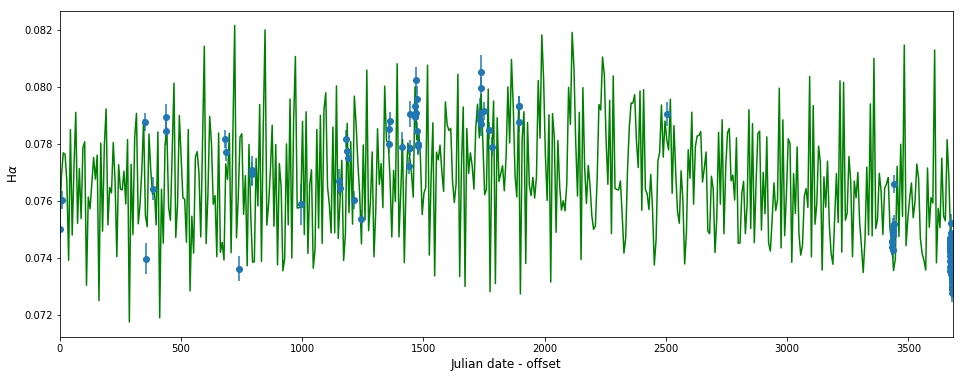

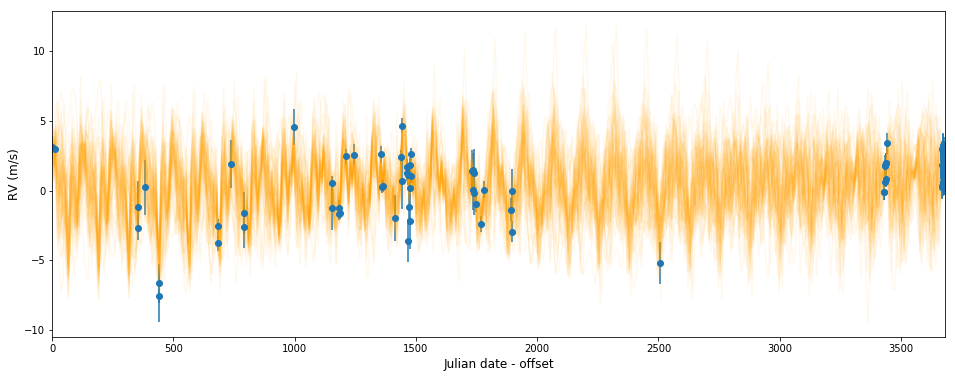

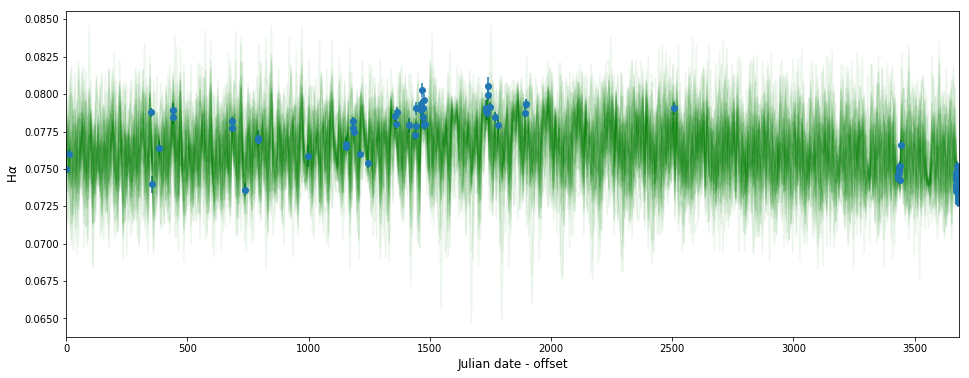

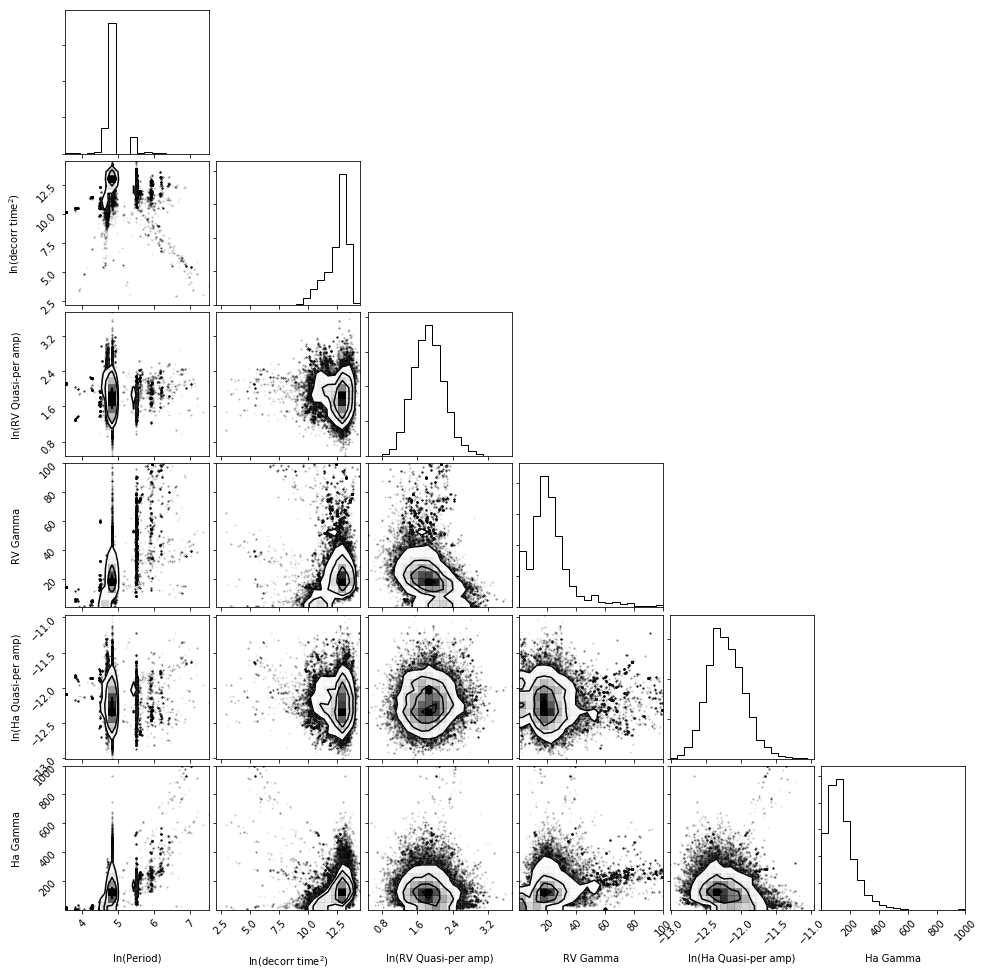

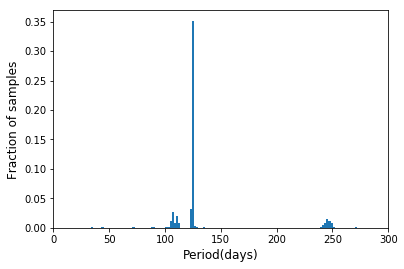

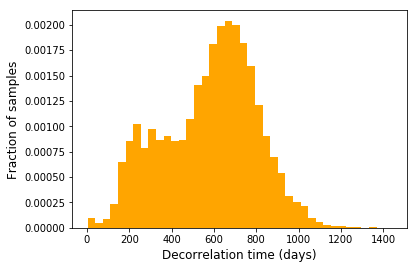

In [22]:
# Make a flat chain of samples with the initial burn-in discarded
samples = sampler.chain[:, nburn:, :].reshape((-1, ndim))

# Plot 50 possible RV curves drawn from the flat chain, along with the data
tt = np.linspace(alldates[0], alldates[-1], 501, endpoint=True)

fig1, (singleRV) = plt.subplots(1,figsize=(16,6))
fig2, (singleha) = plt.subplots(1, figsize=(16,6))
fig3, (RV) = plt.subplots(1, figsize=(16,6))
fig4, (ha) = plt.subplots(1, figsize=(16,6))

for i in range(nwalkers):
    # Choose a sample
    n = np.random.randint(0, samples.shape[0])
    spars_RV, spars_ha = split_par_vec(samples[n])
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    if(i == 0):
        singleRV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange")
        singleha.plot(tt, gp_ha.sample_conditional(allha, tt), "green")   
    # Plot a single sample.
    RV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange", alpha=0.07)
    ha.plot(tt, gp_ha.sample_conditional(allha, tt), "green", alpha=0.07)
    
# Plot the real data
singleRV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
singleha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
RV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
ha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
singleRV.set_xlim(alldates[0], alldates[-1])
singleha.set_xlim(alldates[0], alldates[-1])
RV.set_xlim(alldates[0], alldates[-1])
ha.set_xlim(alldates[0], alldates[-1])

singleRV.set_xlabel("Julian date - offset", fontsize='large')
singleha.set_xlabel("Julian date - offset", fontsize='large')
RV.set_xlabel("Julian date - offset", fontsize='large')
ha.set_xlabel("Julian date - offset", fontsize='large')
singleRV.set_ylabel("RV (m/s)", fontsize='large')
singleha.set_ylabel(r"H$\alpha$", fontsize='large')
RV.set_ylabel("RV (m/s)", fontsize='large')
ha.set_ylabel(r"H$\alpha$", fontsize='large')

parnames = ["ln(Period)", "ln(decorr time$^2$)", "ln(RV Quasi-per amp)", \
            "RV Gamma", "ln(Ha Quasi-per amp)", "Ha Gamma"]
cfig = corner.corner(samples, labels=parnames)

# Plots
plt.figure()
###Made a change here with adding 500. Sme below
periods = np.exp(samples[:,0])
dctimes = np.exp(0.5*samples[:,1])
n_per, bins_per, _ = plt.hist(periods, 1000, density=True)
plt.xlabel("Period(days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')
plt.xlim([0,300])
##plt.ylim([0,0.07])
plt.figure()
n_dc, bins_dc, _ = plt.hist(dctimes, 40, density=True, facecolor='orange')
plt.xlabel("Decorrelation time (days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')

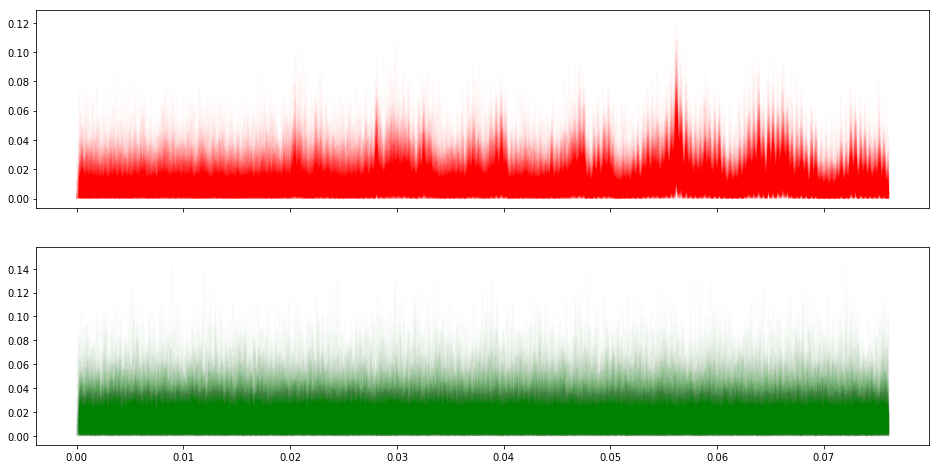

In [23]:
# ##Creating residual plots FIGURE THIS OUT!!
fig5, (ax5, ax6) = plt.subplots(2, sharex=True, figsize=(16,8))
pdsRV = np.zeros(500)
pdsHa = np.zeros(500)

for j in range(500):
    # Choose a sample
    m = np.random.randint(0, (samples.shape[0]))
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    
    #get residuals
    
    residRV = allRV - gp_RV.sample_conditional(allRV, alldates) 
    residHa = allha - gp_ha.sample_conditional(allha, alldates)
                
    #periodogram
    xiRV, pspecRV = LombScargle(alldates, residRV, allRVerr).autopower()
    xiha, pspecha = LombScargle(alldates, residHa, allhaerr).autopower()

    subRV = np.argmax(pspecRV)
    pdsRV[j] = 1.0/xiRV[subRV]
    subHa = np.argmax(pspecha)
    pdsHa[j] = 1.0/xiha[subHa]
    
    ax5.plot(xiRV, pspecRV, 'r-', alpha=0.01)
    ax6.plot(xiha, pspecha, 'g-', alpha=0.01)

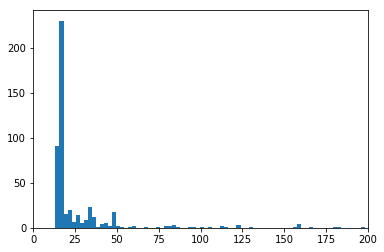

RV residual:  ModeResult(mode=array([17.79630652]), count=array([98]))


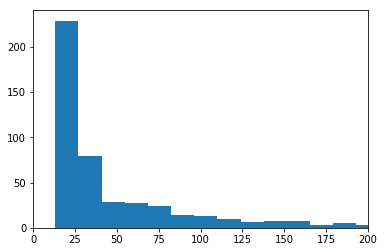

Ha residual:  ModeResult(mode=array([105.50303209]), count=array([5]))


In [24]:
plt.hist(pdsRV, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("RV residual: ", stats.mode(pdsRV))
plt.hist(pdsHa, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("Ha residual: ", stats.mode(pdsHa))

# L-BFGS-B Method

In [25]:
# To install george: $ conda install -c conda-forge george
# Most of this code is borrowed from a tutorial in the george documentation:
# https://george.readthedocs.io/en/latest/tutorials/hyper/
from george import kernels
from george import GP
from george import modeling
from scipy.optimize import minimize
from scipy.optimize import Bounds

# Quasi-periodic kernels
constant_guess_RV = 10. # Amplitudes of squared-exponential decorrelation kernels
constant_guess_ha = 4.0e-5
gamma_guess_RV = 5. # Amplitudes of periodic part of kernels
gamma_guess_ha = 10.
metric_guess = 100000. # Decorrelation timescale SQUARED (days)
period_guess = 120. # Best-fit period from GP model of RV alone

# Create the kernels
kexp2_RV = constant_guess_RV * kernels.ExpSquaredKernel(metric=metric_guess)
kexp2_ha = constant_guess_ha * kernels.ExpSquaredKernel(metric=metric_guess)

kper_RV = kernels.ExpSine2Kernel(gamma=gamma_guess_RV, log_period=np.log(period_guess))
kper_ha = kernels.ExpSine2Kernel(gamma=gamma_guess_ha, log_period=np.log(period_guess))

krot_RV = kexp2_RV * kper_RV
krot_ha = kexp2_ha * kper_ha

# Initialize the Gaussian processes 
gp_RV = GP(krot_RV, fit_kernel=True, mean=np.mean(allRV))##, \
        ##white_noise=modeling.CallableModel(whitenoise_RV, gradient=None))
gp_ha = GP(krot_ha, fit_kernel=True, mean=np.mean(allha))##, \
          ##white_noise=modeling.CallableModel(whitenoise_ha, gradient=None))

# Set reasonable boundaries for each hyperparameter
# Bounds order is same as parameter order: period, metric, 
# RV exp2 amplitude, RV gamma, ha exp2 amplitude, ha gamma,
# ha long-term amplitude, ha long-term metric
##original: lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
##NEW ONES [4.,8.,.....]
##adjusting lower bounds
lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
upper_bounds = [10., 18., 6., 100., 0., 1000]

# Create a Bounds object that will restrict minimize to values within
# the boundaries
par_bounds = Bounds(lower_bounds, upper_bounds)
    
# You need to compute both GPs before starting the optimization.
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates, allhaerr)

# Combine the parameter vectors for both Gaussian processes into
# one (objective function sent to minimize must have only one
# input vector)
RV_pars = gp_RV.get_parameter_vector()
ha_pars = gp_ha.get_parameter_vector()
allpars = make_par_vec(RV_pars, ha_pars)

print("Master parameter vector:", allpars)
# Print the initial ln-likelihood
print("Initial ln-likelihood:", -nll(allpars))

# Run the optimization routine. I DON'T THINK USING george's 
# GRAD_LOG_LIKELIHOOD FUNCTION WILL WORK HERE BECAUSE PERIOD AND 
# DECORRELATION TIMESCALE WILL HAVE DIFFERENT GRADIENTS IN THE 
# HALPHA AND RV PARAMETER SETS.
# results = minimize(nll, allpars, jac=grad_nll, method="L-BFGS-B")
##Potentially use method='emcee'? Using same montecarlo method as is used by acutal emcee runs?
results = minimize(nll, allpars, method="L-BFGS-B", bounds=par_bounds, \
                   options={'maxiter':3000, 'ftol':1.0e-8, 'xtol':1.0e-9, \
                           'gtol':1.0e-8})


# Update the kernels, print the final log-likelihood and results
results_RV, results_ha = split_par_vec(results.x)
final_loglike = -nll(results.x)
npts = len(alldates)
npars = len(allpars)
bic = np.log(npts) * npars - 2.*final_loglike
print("Final ln-likelihood:", final_loglike)
print("Results:",results)
gp_RV.set_parameter_vector(results_RV)
gp_ha.set_parameter_vector(results_ha)

print("\n")

print("Period: %4.2f days" % np.exp(results.x[0]), '\n')
print("Metric: %8.2f days squared" % np.exp(results.x[1]))
print("Decorrelation timescale (sqrt of metric): % 8.2f days" % np.sqrt(np.exp(results.x[1])), '\n')
print("Constant RV kernel multiplier: % 3.2f" % np.exp(results.x[2]))
print("Sqrt of constant RV kernel multiplier (physically meaningful): % 3.2f" % np.sqrt(np.exp(results.x[2])), '\n')
print("Gamma (multiplier of sin2) for RV: % 3.2f" % results.x[3])
print("Roughness parameter omega for RV: % 3.2f" % np.sqrt(0.5/results.x[3]), '\n')
print("Constant Halpha quasiperiodic kernel multiplier: % 0.7f" % np.exp(results.x[4]))
print("Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): %0.7f" % np.sqrt(np.exp(results.x[4])), '\n')
print("Gamma (multiplier of sin2) for Halpha: % 3.3f" % results.x[5])
print("Roughness parameter omega for Halpha: % 3.3f" % np.sqrt(0.5/results.x[5]), '\n')





Master parameter vector: [4.787491742782046, 11.512925464970229, 2.302585092994046, 5.0, -10.126631103850338, 10.0]
Initial ln-likelihood: 413.7361239551002


/Users/student/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:69: OptimizeWarning: Unknown solver options: xtol


Final ln-likelihood: 430.7179241668691
Results:       fun: -430.7179241668691
 hess_inv: <6x6 LbfgsInvHessProduct with dtype=float64>
      jac: array([-0.04820322, -0.00827072,  0.00252385, -0.00086402,  0.01394937,
        0.00025011])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 539
      nit: 60
   status: 0
  success: True
        x: array([  4.90104085,  11.79189541,   2.24438214,   4.30017847,
       -12.28951471,  42.49713176])


Period: 134.43 days 

Metric: 132176.76 days squared
Decorrelation timescale (sqrt of metric):   363.56 days 

Constant RV kernel multiplier:  9.43
Sqrt of constant RV kernel multiplier (physically meaningful):  3.07 

Gamma (multiplier of sin2) for RV:  4.30
Roughness parameter omega for RV:  0.34 

Constant Halpha quasiperiodic kernel multiplier:  0.0000046
Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): 0.0021447 

Gamma (multiplier of sin2) for Halpha:  42.497
Roughness parameter omega fo

## Sample GP

In [26]:
# The same boundaries used in minimize will define the edges of uniform
# prior windows
def lnprior(pars):
    for i in range(len(pars)):
        if ((pars[i] < lower_bounds[i]) or (pars[i] > upper_bounds[i])):
            return -np.inf
    return 0.

# The full log-probability function, including priors
def lnprob(pars):
    ll = -nll(pars)
    lp = lnprior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + ll

# Run the Gaussian processes again
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates,allhaerr)
print("Computed the Gaussian processes")

# Set up the sampler.
nwalkers, ndim = 50, len(allpars)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob)

# Initialize the walkers.
pstart = results.x
p0 = pstart + 1.0e-4 * np.random.randn(nwalkers, ndim)
# Use smaller starting distribution in parameter space for tiny numbers: 
# constants multiplying the Halpha exp2 kernels
p0[:,4] = pstart[4] + 3.0e-7 * np.random.randn(nwalkers)


##Increased both burn in and nproduce
print("Running burn-in")
nburn = 500
p0, _, _ = sampler.run_mcmc(p0, nburn)

print("Running production chain")
nproduce = 2000
sampler.run_mcmc(p0, nproduce)

print("Mean acceptance fraction: {0:.3f}".format(np.mean(sampler.acceptance_fraction)))

Computed the Gaussian processes
Running burn-in
Running production chain
Mean acceptance fraction: 0.292


## Graphs

Text(0,0.5,'Fraction of samples')

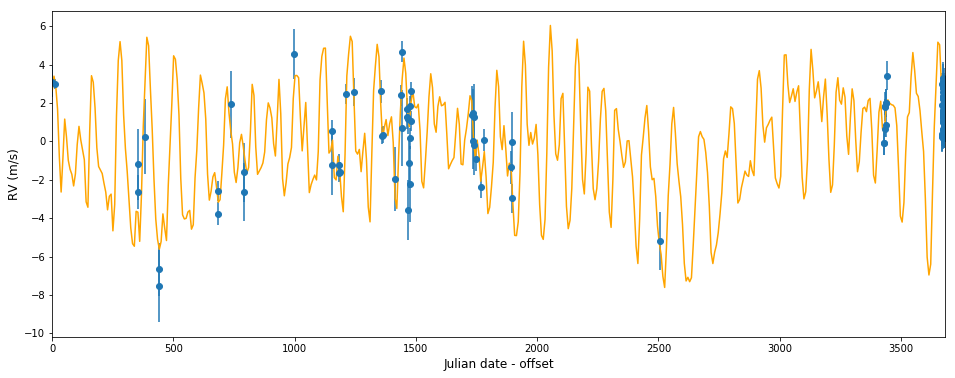

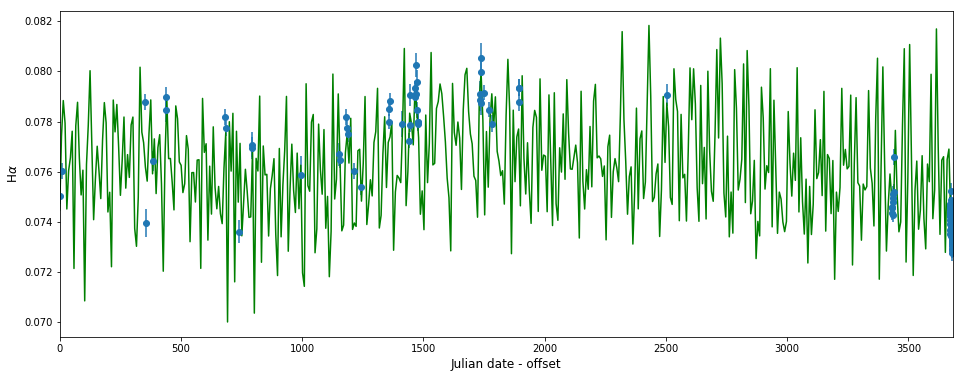

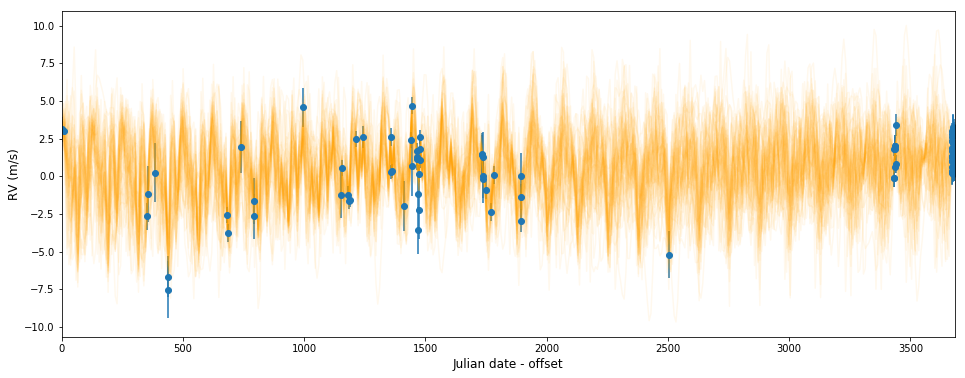

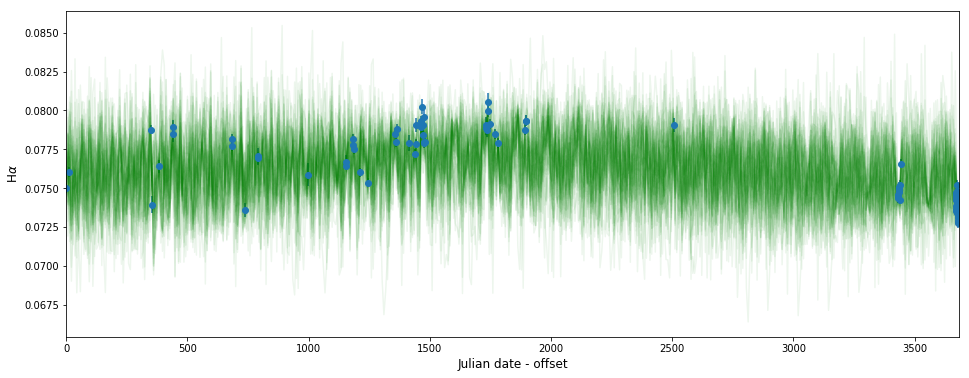

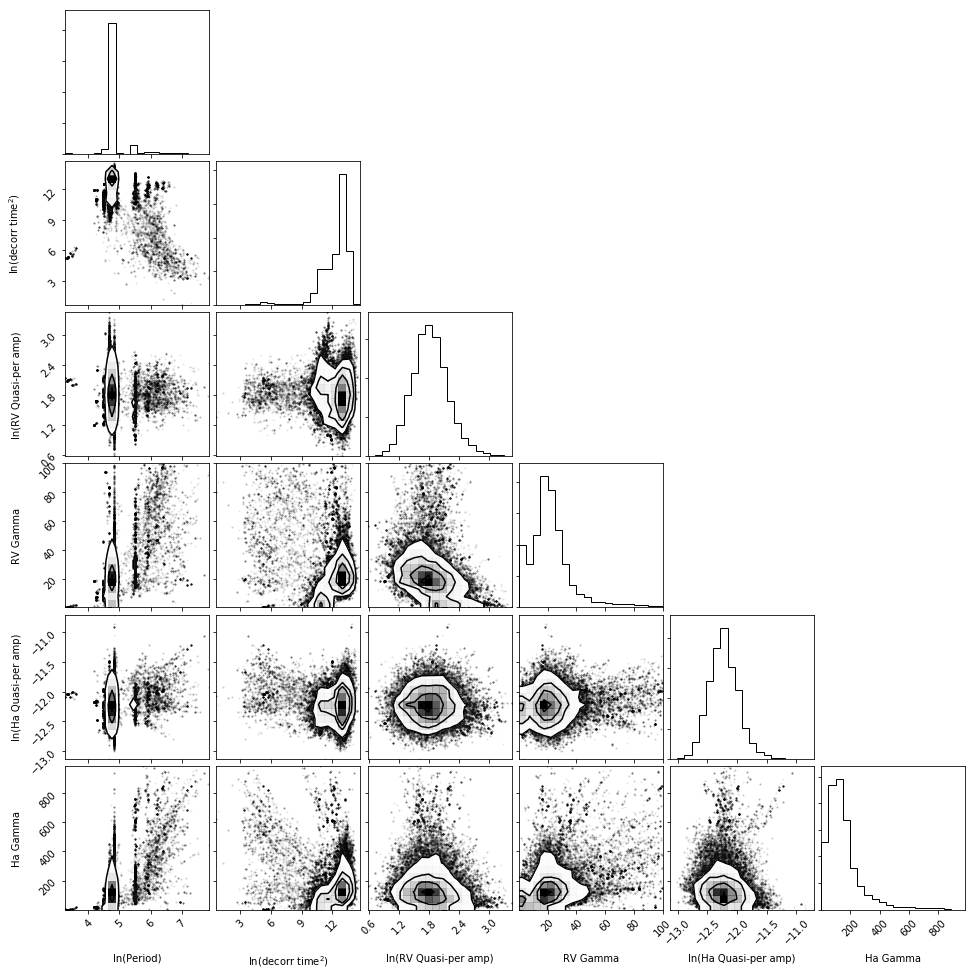

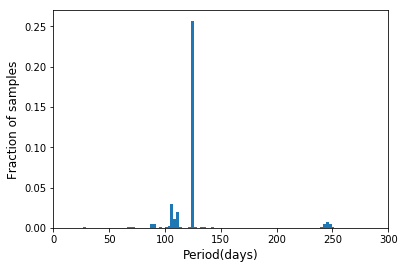

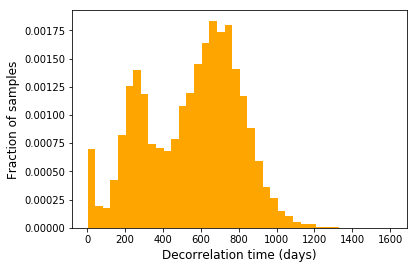

In [27]:
# Make a flat chain of samples with the initial burn-in discarded
samples = sampler.chain[:, nburn:, :].reshape((-1, ndim))

# Plot 50 possible RV curves drawn from the flat chain, along with the data
tt = np.linspace(alldates[0], alldates[-1], 501, endpoint=True)

fig1, (singleRV) = plt.subplots(1,figsize=(16,6))
fig2, (singleha) = plt.subplots(1, figsize=(16,6))
fig3, (RV) = plt.subplots(1, figsize=(16,6))
fig4, (ha) = plt.subplots(1, figsize=(16,6))

for i in range(nwalkers):
    # Choose a sample
    n = np.random.randint(0, samples.shape[0])
    spars_RV, spars_ha = split_par_vec(samples[n])
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    if(i == 0):
        singleRV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange")
        singleha.plot(tt, gp_ha.sample_conditional(allha, tt), "green")   
    # Plot a single sample.
    RV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange", alpha=0.07)
    ha.plot(tt, gp_ha.sample_conditional(allha, tt), "green", alpha=0.07)
    
# Plot the real data
singleRV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
singleha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
RV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
ha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
singleRV.set_xlim(alldates[0], alldates[-1])
singleha.set_xlim(alldates[0], alldates[-1])
RV.set_xlim(alldates[0], alldates[-1])
ha.set_xlim(alldates[0], alldates[-1])

singleRV.set_xlabel("Julian date - offset", fontsize='large')
singleha.set_xlabel("Julian date - offset", fontsize='large')
RV.set_xlabel("Julian date - offset", fontsize='large')
ha.set_xlabel("Julian date - offset", fontsize='large')
singleRV.set_ylabel("RV (m/s)", fontsize='large')
singleha.set_ylabel(r"H$\alpha$", fontsize='large')
RV.set_ylabel("RV (m/s)", fontsize='large')
ha.set_ylabel(r"H$\alpha$", fontsize='large')

parnames = ["ln(Period)", "ln(decorr time$^2$)", "ln(RV Quasi-per amp)", \
            "RV Gamma", "ln(Ha Quasi-per amp)", "Ha Gamma"]
cfig = corner.corner(samples, labels=parnames)

# Plots
plt.figure()
###Made a change here with adding 500. Sme below
periods = np.exp(samples[:,0])
dctimes = np.exp(0.5*samples[:,1])
n_per, bins_per, _ = plt.hist(periods, 1000, density=True)
plt.xlabel("Period(days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')
plt.xlim([0,300])
##plt.ylim([0,0.07])
plt.figure()
n_dc, bins_dc, _ = plt.hist(dctimes, 40, density=True, facecolor='orange')
plt.xlabel("Decorrelation time (days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')

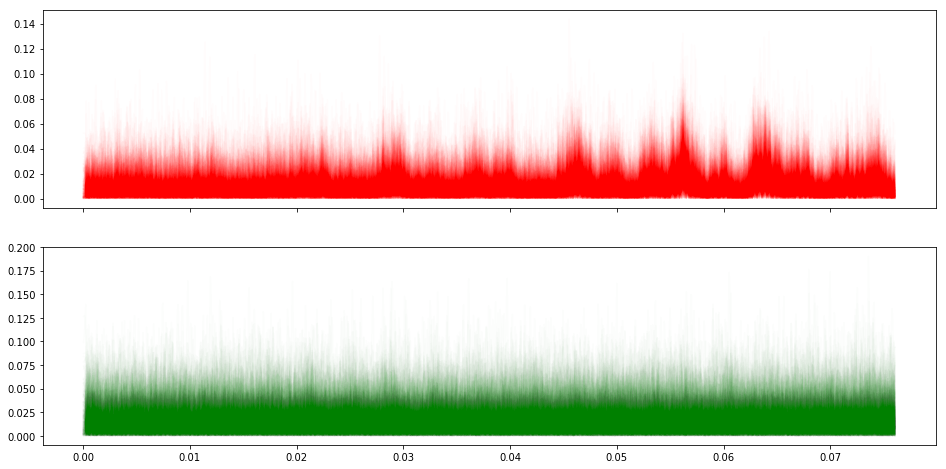

In [28]:
# ##Creating residual plots FIGURE THIS OUT!!
fig5, (ax5, ax6) = plt.subplots(2, sharex=True, figsize=(16,8))
pdsRV = np.zeros(500)
pdsHa = np.zeros(500)

for j in range(500):
    # Choose a sample
    m = np.random.randint(0, (samples.shape[0]))
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    
    #get residuals
    
    residRV = allRV - gp_RV.sample_conditional(allRV, alldates) 
    residHa = allha - gp_ha.sample_conditional(allha, alldates)
                
    #periodogram
    xiRV, pspecRV = LombScargle(alldates, residRV, allRVerr).autopower()
    xiha, pspecha = LombScargle(alldates, residHa, allhaerr).autopower()

    subRV = np.argmax(pspecRV)
    pdsRV[j] = 1.0/xiRV[subRV]
    subHa = np.argmax(pspecha)
    pdsHa[j] = 1.0/xiha[subHa]
    
    ax5.plot(xiRV, pspecRV, 'r-', alpha=0.01)
    ax6.plot(xiha, pspecha, 'g-', alpha=0.01)

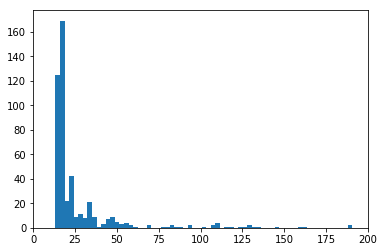

RV residual:  ModeResult(mode=array([17.79630652]), count=array([41]))


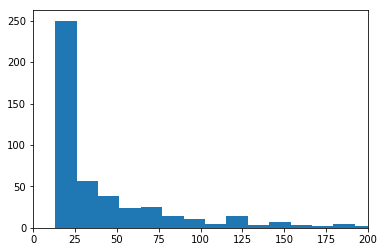

Ha residual:  ModeResult(mode=array([15.87777413]), count=array([4]))


In [29]:
plt.hist(pdsRV, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("RV residual: ", stats.mode(pdsRV))
plt.hist(pdsHa, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("Ha residual: ", stats.mode(pdsHa))

# CG Method

In [30]:
# To install george: $ conda install -c conda-forge george
# Most of this code is borrowed from a tutorial in the george documentation:
# https://george.readthedocs.io/en/latest/tutorials/hyper/
from george import kernels
from george import GP
from george import modeling
from scipy.optimize import minimize
from scipy.optimize import Bounds

# Quasi-periodic kernels
constant_guess_RV = 10. # Amplitudes of squared-exponential decorrelation kernels
constant_guess_ha = 4.0e-5
gamma_guess_RV = 5. # Amplitudes of periodic part of kernels
gamma_guess_ha = 10.
metric_guess = 100000. # Decorrelation timescale SQUARED (days)
period_guess = 120. # Best-fit period from GP model of RV alone

# Create the kernels
kexp2_RV = constant_guess_RV * kernels.ExpSquaredKernel(metric=metric_guess)
kexp2_ha = constant_guess_ha * kernels.ExpSquaredKernel(metric=metric_guess)

kper_RV = kernels.ExpSine2Kernel(gamma=gamma_guess_RV, log_period=np.log(period_guess))
kper_ha = kernels.ExpSine2Kernel(gamma=gamma_guess_ha, log_period=np.log(period_guess))

krot_RV = kexp2_RV * kper_RV
krot_ha = kexp2_ha * kper_ha

# Initialize the Gaussian processes 
gp_RV = GP(krot_RV, fit_kernel=True, mean=np.mean(allRV))##, \
        ##white_noise=modeling.CallableModel(whitenoise_RV, gradient=None))
gp_ha = GP(krot_ha, fit_kernel=True, mean=np.mean(allha))##, \
          ##white_noise=modeling.CallableModel(whitenoise_ha, gradient=None))

# Set reasonable boundaries for each hyperparameter
# Bounds order is same as parameter order: period, metric, 
# RV exp2 amplitude, RV gamma, ha exp2 amplitude, ha gamma,
# ha long-term amplitude, ha long-term metric
##original: lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
##NEW ONES [4.,8.,.....]
##adjusting lower bounds
lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
upper_bounds = [10., 18., 6., 100., 0., 1000]

# Create a Bounds object that will restrict minimize to values within
# the boundaries
par_bounds = Bounds(lower_bounds, upper_bounds)
    
# You need to compute both GPs before starting the optimization.
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates, allhaerr)

# Combine the parameter vectors for both Gaussian processes into
# one (objective function sent to minimize must have only one
# input vector)
RV_pars = gp_RV.get_parameter_vector()
ha_pars = gp_ha.get_parameter_vector()
allpars = make_par_vec(RV_pars, ha_pars)

print("Master parameter vector:", allpars)
# Print the initial ln-likelihood
print("Initial ln-likelihood:", -nll(allpars))

# Run the optimization routine. I DON'T THINK USING george's 
# GRAD_LOG_LIKELIHOOD FUNCTION WILL WORK HERE BECAUSE PERIOD AND 
# DECORRELATION TIMESCALE WILL HAVE DIFFERENT GRADIENTS IN THE 
# HALPHA AND RV PARAMETER SETS.
# results = minimize(nll, allpars, jac=grad_nll, method="L-BFGS-B")
##Potentially use method='emcee'? Using same montecarlo method as is used by acutal emcee runs?
results = minimize(nll, allpars, method="CG", bounds=par_bounds, \
                   options={'maxiter':3000, 'ftol':1.0e-8, 'xtol':1.0e-9, \
                           'gtol':1.0e-8})


# Update the kernels, print the final log-likelihood and results
results_RV, results_ha = split_par_vec(results.x)
final_loglike = -nll(results.x)
npts = len(alldates)
npars = len(allpars)
bic = np.log(npts) * npars - 2.*final_loglike
print("Final ln-likelihood:", final_loglike)
print("Results:",results)
gp_RV.set_parameter_vector(results_RV)
gp_ha.set_parameter_vector(results_ha)

print("\n")

print("Period: %4.2f days" % np.exp(results.x[0]), '\n')
print("Metric: %8.2f days squared" % np.exp(results.x[1]))
print("Decorrelation timescale (sqrt of metric): % 8.2f days" % np.sqrt(np.exp(results.x[1])), '\n')
print("Constant RV kernel multiplier: % 3.2f" % np.exp(results.x[2]))
print("Sqrt of constant RV kernel multiplier (physically meaningful): % 3.2f" % np.sqrt(np.exp(results.x[2])), '\n')
print("Gamma (multiplier of sin2) for RV: % 3.2f" % results.x[3])
print("Roughness parameter omega for RV: % 3.2f" % np.sqrt(0.5/results.x[3]), '\n')
print("Constant Halpha quasiperiodic kernel multiplier: % 0.7f" % np.exp(results.x[4]))
print("Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): %0.7f" % np.sqrt(np.exp(results.x[4])), '\n')
print("Gamma (multiplier of sin2) for Halpha: % 3.3f" % results.x[5])
print("Roughness parameter omega for Halpha: % 3.3f" % np.sqrt(0.5/results.x[5]), '\n')






Master parameter vector: [4.787491742782046, 11.512925464970229, 2.302585092994046, 5.0, -10.126631103850338, 10.0]
Initial ln-likelihood: 413.7361239551002


/Users/student/anaconda3/lib/python3.6/site-packages/scipy/optimize/_minimize.py:518: RuntimeWarning: Method CG cannot handle constraints nor bounds.
  RuntimeWarning)
/Users/student/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:69: OptimizeWarning: Unknown solver options: ftol, xtol


Final ln-likelihood: 437.91119966661313
Results:      fun: -437.91119966661313
     jac: array([-1.63742065e-01,  1.35269165e-02, -4.31823730e-03, -1.48773193e-04,
       -4.15039062e-02, -1.65023804e-02])
 message: 'Maximum number of iterations has been exceeded.'
    nfev: 70585
     nit: 3000
    njev: 8820
  status: 1
 success: False
       x: array([  4.8264179 ,  13.14759167,   1.83151374,  19.13281608,
       -12.21804421,  89.38777356])


Period: 124.76 days 

Metric: 512774.61 days squared
Decorrelation timescale (sqrt of metric):   716.08 days 

Constant RV kernel multiplier:  6.24
Sqrt of constant RV kernel multiplier (physically meaningful):  2.50 

Gamma (multiplier of sin2) for RV:  19.13
Roughness parameter omega for RV:  0.16 

Constant Halpha quasiperiodic kernel multiplier:  0.0000049
Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): 0.0022227 

Gamma (multiplier of sin2) for Halpha:  89.388
Roughness parameter omega for Halpha:  0.075 


## Sample GP

In [31]:
# The same boundaries used in minimize will define the edges of uniform
# prior windows
def lnprior(pars):
    for i in range(len(pars)):
        if ((pars[i] < lower_bounds[i]) or (pars[i] > upper_bounds[i])):
            return -np.inf
    return 0.

# The full log-probability function, including priors
def lnprob(pars):
    ll = -nll(pars)
    lp = lnprior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + ll

# Run the Gaussian processes again
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates,allhaerr)
print("Computed the Gaussian processes")

# Set up the sampler.
nwalkers, ndim = 50, len(allpars)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob)

# Initialize the walkers.
pstart = results.x
p0 = pstart + 1.0e-4 * np.random.randn(nwalkers, ndim)
# Use smaller starting distribution in parameter space for tiny numbers: 
# constants multiplying the Halpha exp2 kernels
p0[:,4] = pstart[4] + 3.0e-7 * np.random.randn(nwalkers)


##Increased both burn in and nproduce
print("Running burn-in")
nburn = 500
p0, _, _ = sampler.run_mcmc(p0, nburn)

print("Running production chain")
nproduce = 2000
sampler.run_mcmc(p0, nproduce)

print("Mean acceptance fraction: {0:.3f}".format(np.mean(sampler.acceptance_fraction)))

Computed the Gaussian processes
Running burn-in
Running production chain
Mean acceptance fraction: 0.496


## Graphs

Text(0,0.5,'Fraction of samples')

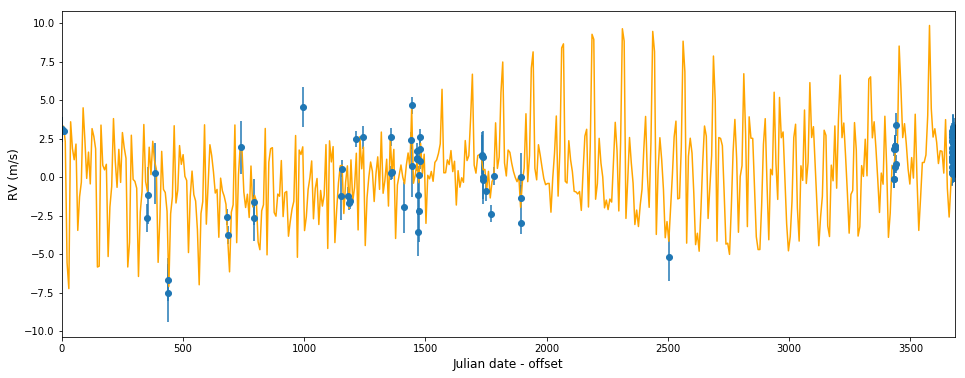

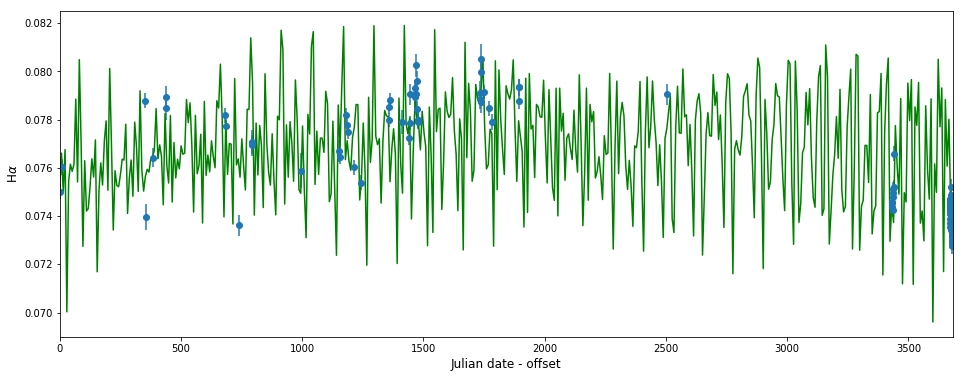

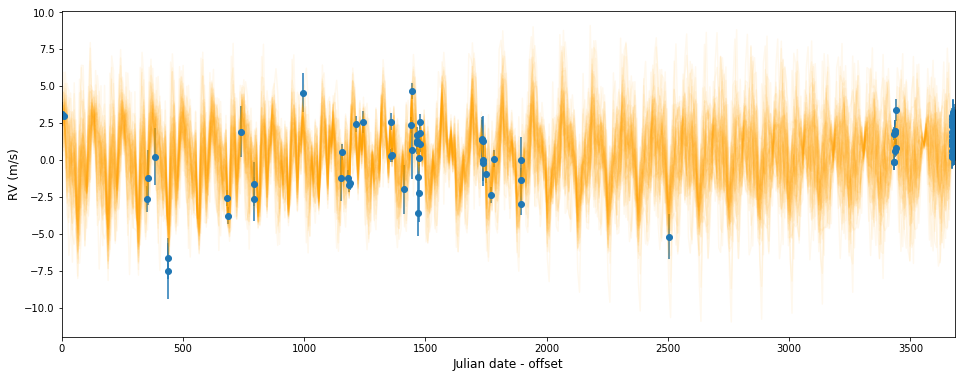

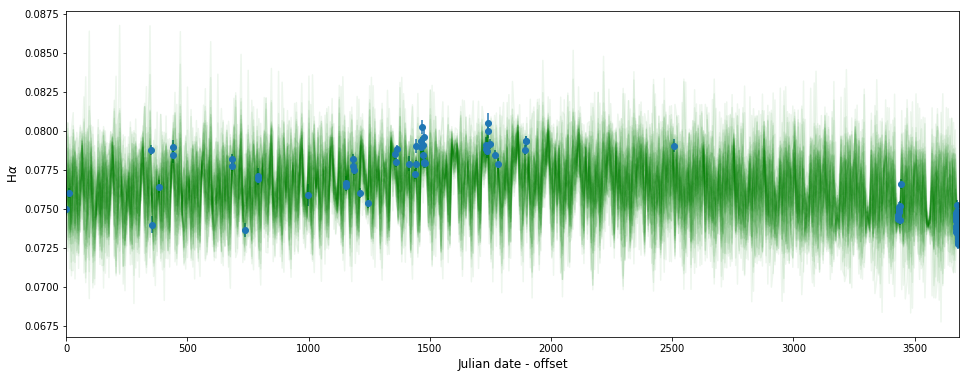

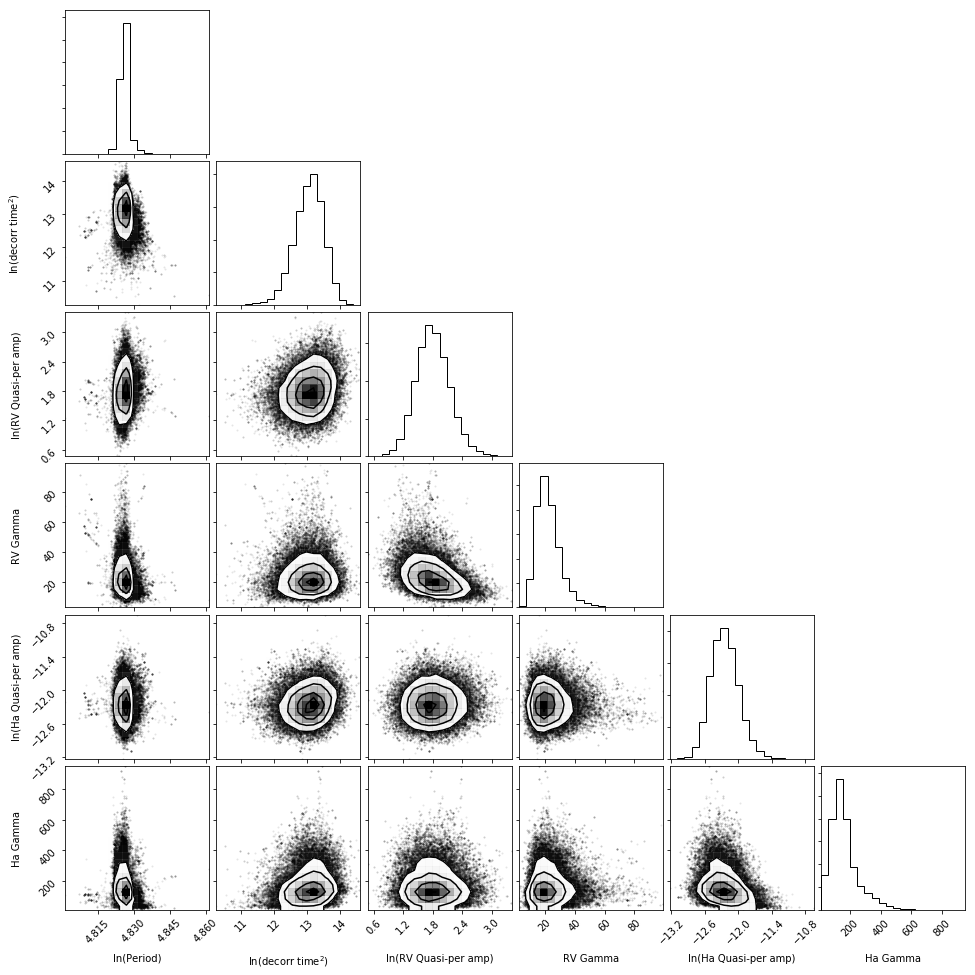

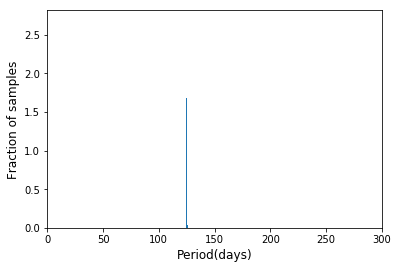

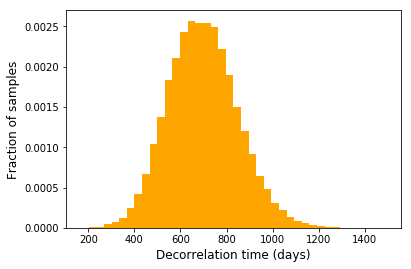

In [32]:
# Make a flat chain of samples with the initial burn-in discarded
samples = sampler.chain[:, nburn:, :].reshape((-1, ndim))

# Plot 50 possible RV curves drawn from the flat chain, along with the data
tt = np.linspace(alldates[0], alldates[-1], 501, endpoint=True)

fig1, (singleRV) = plt.subplots(1,figsize=(16,6))
fig2, (singleha) = plt.subplots(1, figsize=(16,6))
fig3, (RV) = plt.subplots(1, figsize=(16,6))
fig4, (ha) = plt.subplots(1, figsize=(16,6))

for i in range(nwalkers):
    # Choose a sample
    n = np.random.randint(0, samples.shape[0])
    spars_RV, spars_ha = split_par_vec(samples[n])
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    if(i == 0):
        singleRV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange")
        singleha.plot(tt, gp_ha.sample_conditional(allha, tt), "green")   
    # Plot a single sample.
    RV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange", alpha=0.07)
    ha.plot(tt, gp_ha.sample_conditional(allha, tt), "green", alpha=0.07)
    
# Plot the real data
singleRV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
singleha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
RV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
ha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
singleRV.set_xlim(alldates[0], alldates[-1])
singleha.set_xlim(alldates[0], alldates[-1])
RV.set_xlim(alldates[0], alldates[-1])
ha.set_xlim(alldates[0], alldates[-1])

singleRV.set_xlabel("Julian date - offset", fontsize='large')
singleha.set_xlabel("Julian date - offset", fontsize='large')
RV.set_xlabel("Julian date - offset", fontsize='large')
ha.set_xlabel("Julian date - offset", fontsize='large')
singleRV.set_ylabel("RV (m/s)", fontsize='large')
singleha.set_ylabel(r"H$\alpha$", fontsize='large')
RV.set_ylabel("RV (m/s)", fontsize='large')
ha.set_ylabel(r"H$\alpha$", fontsize='large')

parnames = ["ln(Period)", "ln(decorr time$^2$)", "ln(RV Quasi-per amp)", \
            "RV Gamma", "ln(Ha Quasi-per amp)", "Ha Gamma"]
cfig = corner.corner(samples, labels=parnames)

# Plots
plt.figure()
###Made a change here with adding 500. Sme below
periods = np.exp(samples[:,0])
dctimes = np.exp(0.5*samples[:,1])
n_per, bins_per, _ = plt.hist(periods, 1000, density=True)
plt.xlabel("Period(days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')
plt.xlim([0,300])
##plt.ylim([0,0.07])
plt.figure()
n_dc, bins_dc, _ = plt.hist(dctimes, 40, density=True, facecolor='orange')
plt.xlabel("Decorrelation time (days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')

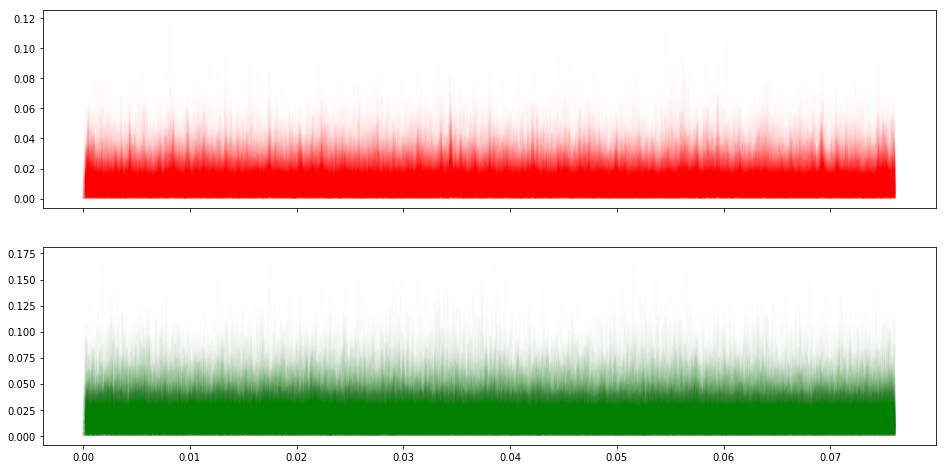

In [33]:
# ##Creating residual plots FIGURE THIS OUT!!
fig5, (ax5, ax6) = plt.subplots(2, sharex=True, figsize=(16,8))
pdsRV = np.zeros(500)
pdsHa = np.zeros(500)

for j in range(500):
    # Choose a sample
    m = np.random.randint(0, (samples.shape[0]))
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    
    #get residuals
    
    residRV = allRV - gp_RV.sample_conditional(allRV, alldates) 
    residHa = allha - gp_ha.sample_conditional(allha, alldates)
                
    #periodogram
    xiRV, pspecRV = LombScargle(alldates, residRV, allRVerr).autopower()
    xiha, pspecha = LombScargle(alldates, residHa, allhaerr).autopower()

    subRV = np.argmax(pspecRV)
    pdsRV[j] = 1.0/xiRV[subRV]
    subHa = np.argmax(pspecha)
    pdsHa[j] = 1.0/xiha[subHa]
    
    ax5.plot(xiRV, pspecRV, 'r-', alpha=0.01)
    ax6.plot(xiha, pspecha, 'g-', alpha=0.01)

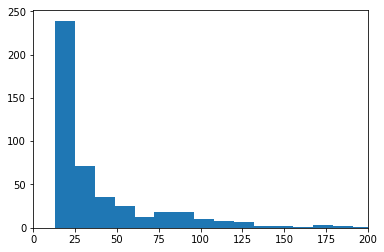

RV residual:  ModeResult(mode=array([29.01541229]), count=array([6]))


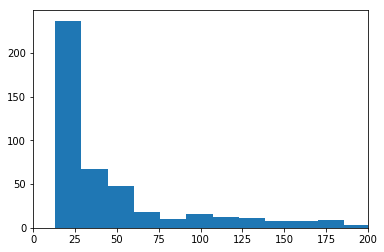

Ha residual:  ModeResult(mode=array([13.19260416]), count=array([3]))


In [34]:
plt.hist(pdsRV, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("RV residual: ", stats.mode(pdsRV))
plt.hist(pdsHa, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("Ha residual: ", stats.mode(pdsHa))

# BFGS Method

In [35]:
# To install george: $ conda install -c conda-forge george
# Most of this code is borrowed from a tutorial in the george documentation:
# https://george.readthedocs.io/en/latest/tutorials/hyper/
from george import kernels
from george import GP
from george import modeling
from scipy.optimize import minimize
from scipy.optimize import Bounds

# Quasi-periodic kernels
constant_guess_RV = 10. # Amplitudes of squared-exponential decorrelation kernels
constant_guess_ha = 4.0e-5
gamma_guess_RV = 5. # Amplitudes of periodic part of kernels
gamma_guess_ha = 10.
metric_guess = 100000. # Decorrelation timescale SQUARED (days)
period_guess = 120. # Best-fit period from GP model of RV alone

# Create the kernels
kexp2_RV = constant_guess_RV * kernels.ExpSquaredKernel(metric=metric_guess)
kexp2_ha = constant_guess_ha * kernels.ExpSquaredKernel(metric=metric_guess)

kper_RV = kernels.ExpSine2Kernel(gamma=gamma_guess_RV, log_period=np.log(period_guess))
kper_ha = kernels.ExpSine2Kernel(gamma=gamma_guess_ha, log_period=np.log(period_guess))

krot_RV = kexp2_RV * kper_RV
krot_ha = kexp2_ha * kper_ha

# Initialize the Gaussian processes 
# Initialize the Gaussian processes 
gp_RV = GP(krot_RV, fit_kernel=True, mean=np.mean(allRV))##, \
        ##white_noise=modeling.CallableModel(whitenoise_RV, gradient=None))
gp_ha = GP(krot_ha, fit_kernel=True, mean=np.mean(allha))##, \
          ##white_noise=modeling.CallableModel(whitenoise_ha, gradient=None))

# Set reasonable boundaries for each hyperparameter
# Bounds order is same as parameter order: period, metric, 
# RV exp2 amplitude, RV gamma, ha exp2 amplitude, ha gamma,
# ha long-term amplitude, ha long-term metric
##original: lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
##NEW ONES [4.,8.,.....]
##adjusting lower bounds
lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
upper_bounds = [10., 18., 6., 100., 0., 1000]

# Create a Bounds object that will restrict minimize to values within
# the boundaries
par_bounds = Bounds(lower_bounds, upper_bounds)
    
# You need to compute both GPs before starting the optimization.
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates, allhaerr)

# Combine the parameter vectors for both Gaussian processes into
# one (objective function sent to minimize must have only one
# input vector)
RV_pars = gp_RV.get_parameter_vector()
ha_pars = gp_ha.get_parameter_vector()
allpars = make_par_vec(RV_pars, ha_pars)

print("Master parameter vector:", allpars)
# Print the initial ln-likelihood
print("Initial ln-likelihood:", -nll(allpars))

# Run the optimization routine. I DON'T THINK USING george's 
# GRAD_LOG_LIKELIHOOD FUNCTION WILL WORK HERE BECAUSE PERIOD AND 
# DECORRELATION TIMESCALE WILL HAVE DIFFERENT GRADIENTS IN THE 
# HALPHA AND RV PARAMETER SETS.
# results = minimize(nll, allpars, jac=grad_nll, method="L-BFGS-B")
##Potentially use method='emcee'? Using same montecarlo method as is used by acutal emcee runs?
results = minimize(nll, allpars, method="BFGS", bounds=par_bounds, \
                   options={'maxiter':3000, 'ftol':1.0e-8, 'xtol':1.0e-9, \
                           'gtol':1.0e-8})


# Update the kernels, print the final log-likelihood and results
results_RV, results_ha = split_par_vec(results.x)
final_loglike = -nll(results.x)
npts = len(alldates)
npars = len(allpars)
bic = np.log(npts) * npars - 2.*final_loglike
print("Final ln-likelihood:", final_loglike)
print("Results:",results)
gp_RV.set_parameter_vector(results_RV)
gp_ha.set_parameter_vector(results_ha)

print("\n")

print("Period: %4.2f days" % np.exp(results.x[0]), '\n')
print("Metric: %8.2f days squared" % np.exp(results.x[1]))
print("Decorrelation timescale (sqrt of metric): % 8.2f days" % np.sqrt(np.exp(results.x[1])), '\n')
print("Constant RV kernel multiplier: % 3.2f" % np.exp(results.x[2]))
print("Sqrt of constant RV kernel multiplier (physically meaningful): % 3.2f" % np.sqrt(np.exp(results.x[2])), '\n')
print("Gamma (multiplier of sin2) for RV: % 3.2f" % results.x[3])
print("Roughness parameter omega for RV: % 3.2f" % np.sqrt(0.5/results.x[3]), '\n')
print("Constant Halpha quasiperiodic kernel multiplier: % 0.7f" % np.exp(results.x[4]))
print("Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): %0.7f" % np.sqrt(np.exp(results.x[4])), '\n')
print("Gamma (multiplier of sin2) for Halpha: % 3.3f" % results.x[5])
print("Roughness parameter omega for Halpha: % 3.3f" % np.sqrt(0.5/results.x[5]), '\n')

Master parameter vector: [4.787491742782046, 11.512925464970229, 2.302585092994046, 5.0, -10.126631103850338, 10.0]
Initial ln-likelihood: 413.7361239551002


/Users/student/anaconda3/lib/python3.6/site-packages/scipy/optimize/_minimize.py:518: RuntimeWarning: Method BFGS cannot handle constraints nor bounds.
  RuntimeWarning)
/Users/student/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:70: OptimizeWarning: Unknown solver options: ftol, xtol


Final ln-likelihood: 427.94573418644836
Results:       fun: -427.94573418644836
 hess_inv: array([[ 5.18286529e-05,  1.08149218e-03,  2.32660757e-04,
         6.95981790e-04, -2.36823239e-04, -3.49117457e-04],
       [ 1.08149218e-03,  3.06597872e-01,  3.38527858e-02,
         2.47765621e-02,  5.35497950e-02, -2.02831450e-01],
       [ 2.32660757e-04,  3.38527858e-02,  1.06500126e-01,
        -3.63125428e-03, -1.49926382e-03, -4.84786095e-02],
       [ 6.95981790e-04,  2.47765621e-02, -3.63125428e-03,
         2.07500253e-01, -1.27338704e-01,  9.59369889e-02],
       [-2.36823239e-04,  5.35497950e-02, -1.49926382e-03,
        -1.27338704e-01,  9.57036563e-02, -1.05068403e-01],
       [-3.49117457e-04, -2.02831450e-01, -4.84786095e-02,
         9.59369889e-02, -1.05068403e-01,  2.00711061e-01]])
      jac: array([ 2.64739990e-03,  6.10351562e-05, -1.37329102e-04, -3.05175781e-05,
        1.52587891e-04,  7.62939453e-06])
  message: 'Desired error not necessarily achieved due to precisio

In [36]:
# The same boundaries used in minimize will define the edges of uniform
# prior windows
def lnprior(pars):
    for i in range(len(pars)):
        if ((pars[i] < lower_bounds[i]) or (pars[i] > upper_bounds[i])):
            return -np.inf
    return 0.

# The full log-probability function, including priors
def lnprob(pars):
    ll = -nll(pars)
    lp = lnprior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + ll

# Run the Gaussian processes again
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates,allhaerr)
print("Computed the Gaussian processes")

# Set up the sampler.
nwalkers, ndim = 50, len(allpars)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob)

# Initialize the walkers.
pstart = results.x
p0 = pstart + 1.0e-4 * np.random.randn(nwalkers, ndim)
# Use smaller starting distribution in parameter space for tiny numbers: 
# constants multiplying the Halpha exp2 kernels
p0[:,4] = pstart[4] + 3.0e-7 * np.random.randn(nwalkers)


##Increased both burn in and nproduce
print("Running burn-in")
nburn = 500
p0, _, _ = sampler.run_mcmc(p0, nburn)

print("Running production chain")
nproduce = 2000
sampler.run_mcmc(p0, nproduce)

print("Mean acceptance fraction: {0:.3f}".format(np.mean(sampler.acceptance_fraction)))

Computed the Gaussian processes
Running burn-in
Running production chain
Mean acceptance fraction: 0.275


## Graphs

Text(0,0.5,'Fraction of samples')

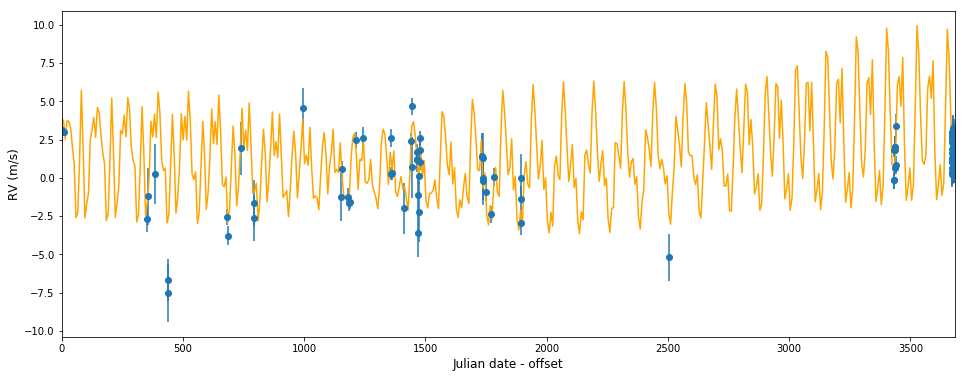

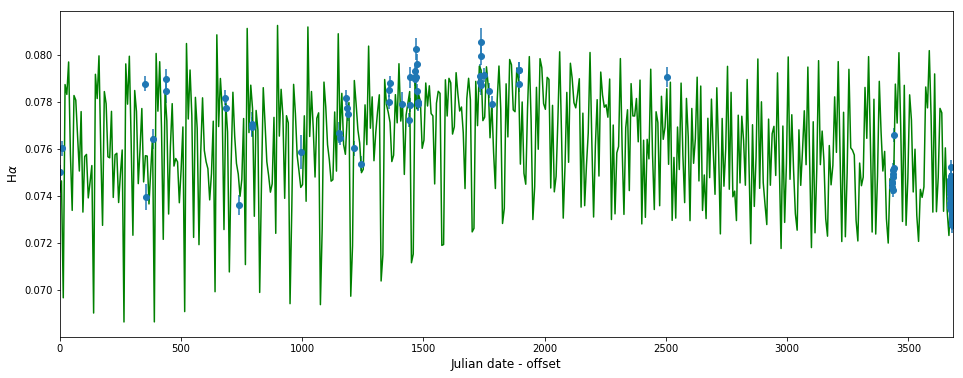

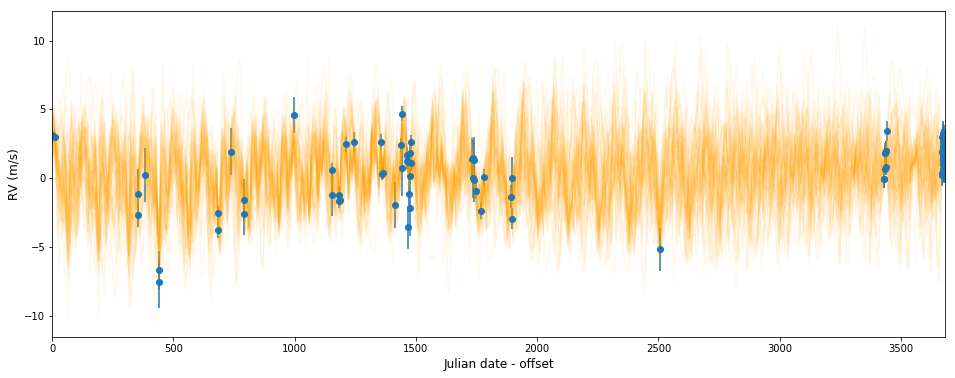

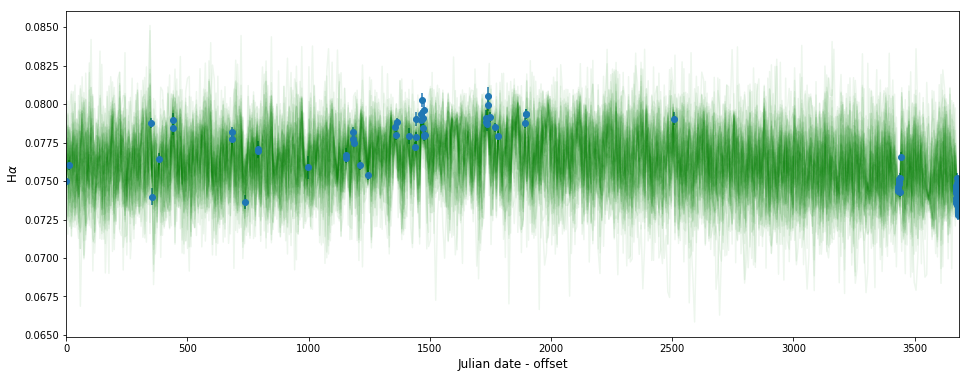

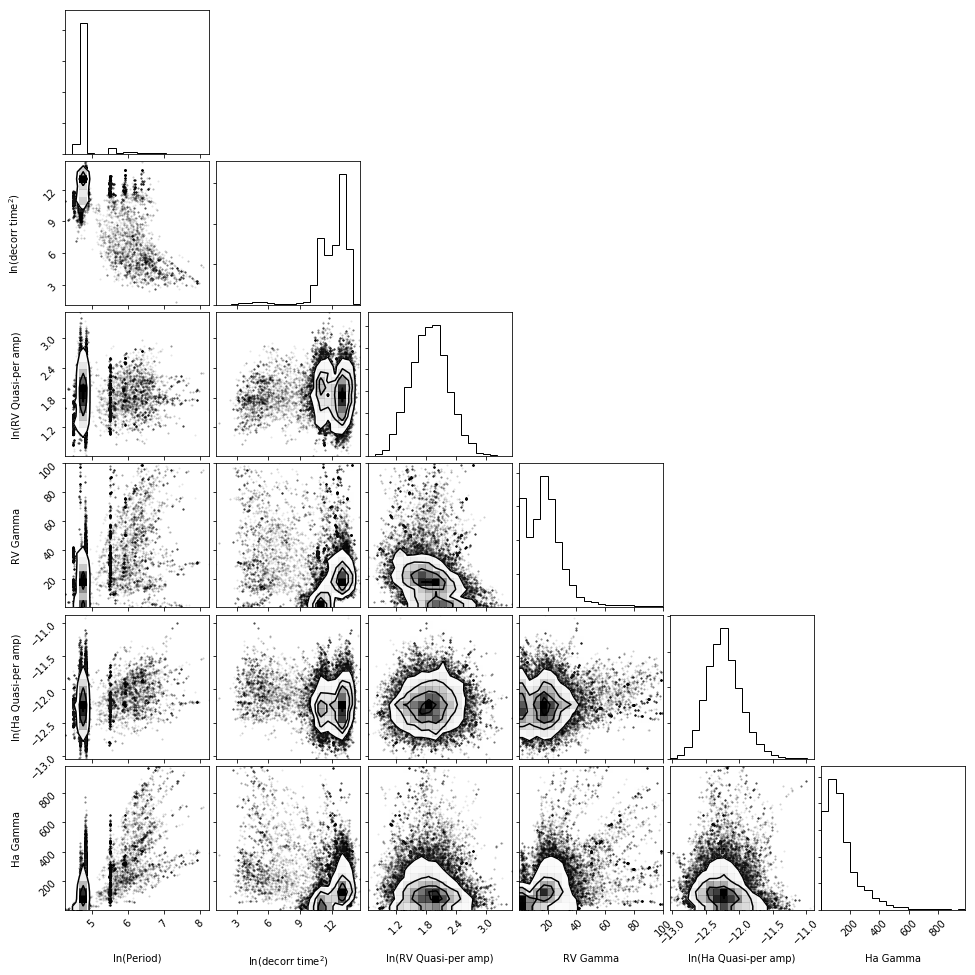

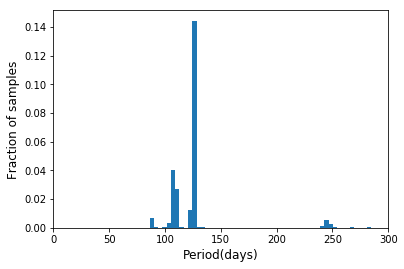

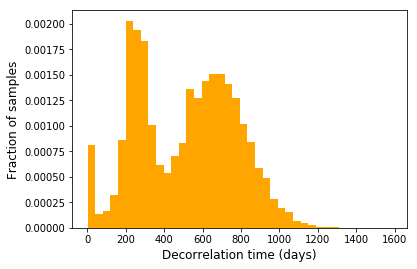

In [37]:
# Make a flat chain of samples with the initial burn-in discarded
samples = sampler.chain[:, nburn:, :].reshape((-1, ndim))

# Plot 50 possible RV curves drawn from the flat chain, along with the data
tt = np.linspace(alldates[0], alldates[-1], 501, endpoint=True)

fig1, (singleRV) = plt.subplots(1,figsize=(16,6))
fig2, (singleha) = plt.subplots(1, figsize=(16,6))
fig3, (RV) = plt.subplots(1, figsize=(16,6))
fig4, (ha) = plt.subplots(1, figsize=(16,6))

for i in range(nwalkers):
    # Choose a sample
    n = np.random.randint(0, samples.shape[0])
    spars_RV, spars_ha = split_par_vec(samples[n])
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    if(i == 0):
        singleRV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange")
        singleha.plot(tt, gp_ha.sample_conditional(allha, tt), "green")   
    # Plot a single sample.
    RV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange", alpha=0.07)
    ha.plot(tt, gp_ha.sample_conditional(allha, tt), "green", alpha=0.07)
    
# Plot the real data
singleRV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
singleha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
RV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
ha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
singleRV.set_xlim(alldates[0], alldates[-1])
singleha.set_xlim(alldates[0], alldates[-1])
RV.set_xlim(alldates[0], alldates[-1])
ha.set_xlim(alldates[0], alldates[-1])

singleRV.set_xlabel("Julian date - offset", fontsize='large')
singleha.set_xlabel("Julian date - offset", fontsize='large')
RV.set_xlabel("Julian date - offset", fontsize='large')
ha.set_xlabel("Julian date - offset", fontsize='large')
singleRV.set_ylabel("RV (m/s)", fontsize='large')
singleha.set_ylabel(r"H$\alpha$", fontsize='large')
RV.set_ylabel("RV (m/s)", fontsize='large')
ha.set_ylabel(r"H$\alpha$", fontsize='large')

parnames = ["ln(Period)", "ln(decorr time$^2$)", "ln(RV Quasi-per amp)", \
            "RV Gamma", "ln(Ha Quasi-per amp)", "Ha Gamma"]
cfig = corner.corner(samples, labels=parnames)

# Plots
plt.figure()
###Made a change here with adding 500. Sme below
periods = np.exp(samples[:,0])
dctimes = np.exp(0.5*samples[:,1])
n_per, bins_per, _ = plt.hist(periods, 1000, density=True)
plt.xlabel("Period(days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')
plt.xlim([0,300])
##plt.ylim([0,0.07])
plt.figure()
n_dc, bins_dc, _ = plt.hist(dctimes, 40, density=True, facecolor='orange')
plt.xlabel("Decorrelation time (days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')

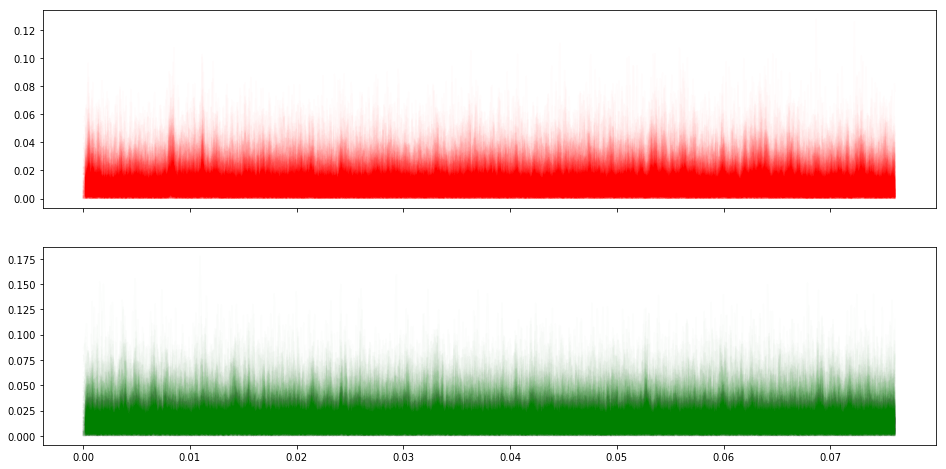

In [38]:
# ##Creating residual plots FIGURE THIS OUT!!
fig5, (ax5, ax6) = plt.subplots(2, sharex=True, figsize=(16,8))
pdsRV = np.zeros(500)
pdsHa = np.zeros(500)

for j in range(500):
    # Choose a sample
    m = np.random.randint(0, (samples.shape[0]))
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    
    #get residuals
    
    residRV = allRV - gp_RV.sample_conditional(allRV, alldates) 
    residHa = allha - gp_ha.sample_conditional(allha, alldates)
                
    #periodogram
    xiRV, pspecRV = LombScargle(alldates, residRV, allRVerr).autopower()
    xiha, pspecha = LombScargle(alldates, residHa, allhaerr).autopower()

    subRV = np.argmax(pspecRV)
    pdsRV[j] = 1.0/xiRV[subRV]
    subHa = np.argmax(pspecha)
    pdsHa[j] = 1.0/xiha[subHa]
    
    ax5.plot(xiRV, pspecRV, 'r-', alpha=0.01)
    ax6.plot(xiha, pspecha, 'g-', alpha=0.01)

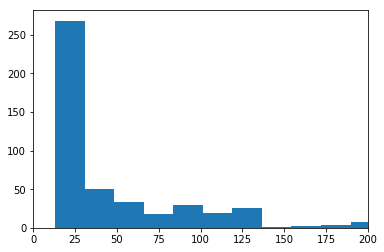

RV residual:  ModeResult(mode=array([118.39407781]), count=array([8]))


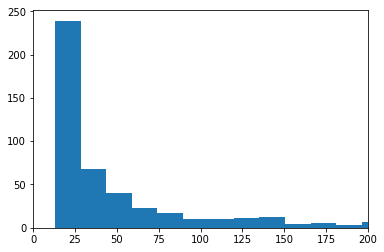

Ha residual:  ModeResult(mode=array([203.42849834]), count=array([6]))


In [39]:
plt.hist(pdsRV, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("RV residual: ", stats.mode(pdsRV))
plt.hist(pdsHa, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("Ha residual: ", stats.mode(pdsHa))

# SLSQP Method

In [40]:
# To install george: $ conda install -c conda-forge george
# Most of this code is borrowed from a tutorial in the george documentation:
# https://george.readthedocs.io/en/latest/tutorials/hyper/
from george import kernels
from george import GP
from george import modeling
from scipy.optimize import minimize
from scipy.optimize import Bounds

# Quasi-periodic kernels
constant_guess_RV = 10. # Amplitudes of squared-exponential decorrelation kernels
constant_guess_ha = 4.0e-5
gamma_guess_RV = 5. # Amplitudes of periodic part of kernels
gamma_guess_ha = 10.
metric_guess = 100000. # Decorrelation timescale SQUARED (days)
period_guess = 120. # Best-fit period from GP model of RV alone

# Create the kernels
kexp2_RV = constant_guess_RV * kernels.ExpSquaredKernel(metric=metric_guess)
kexp2_ha = constant_guess_ha * kernels.ExpSquaredKernel(metric=metric_guess)

kper_RV = kernels.ExpSine2Kernel(gamma=gamma_guess_RV, log_period=np.log(period_guess))
kper_ha = kernels.ExpSine2Kernel(gamma=gamma_guess_ha, log_period=np.log(period_guess))

krot_RV = kexp2_RV * kper_RV
krot_ha = kexp2_ha * kper_ha

# Initialize the Gaussian processes 
gp_RV = GP(krot_RV, fit_kernel=True, mean=np.mean(allRV))##, \
        ##white_noise=modeling.CallableModel(whitenoise_RV, gradient=None))
gp_ha = GP(krot_ha, fit_kernel=True, mean=np.mean(allha))##, \
          ##white_noise=modeling.CallableModel(whitenoise_ha, gradient=None))
    
# Set reasonable boundaries for each hyperparameter
# Bounds order is same as parameter order: period, metric, 
# RV exp2 amplitude, RV gamma, ha exp2 amplitude, ha gamma,
# ha long-term amplitude, ha long-term metric
##original: lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
##NEW ONES [4.,8.,.....]
##adjusting lower bounds
lower_bounds = [-2., 0., -4., 1.0e-5, -20.,1.0e-5]
upper_bounds = [10., 18., 6., 100., 0., 1000]

# Create a Bounds object that will restrict minimize to values within
# the boundaries
par_bounds = Bounds(lower_bounds, upper_bounds)
    
# You need to compute both GPs before starting the optimization.
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates, allhaerr)

# Combine the parameter vectors for both Gaussian processes into
# one (objective function sent to minimize must have only one
# input vector)
RV_pars = gp_RV.get_parameter_vector()
ha_pars = gp_ha.get_parameter_vector()
allpars = make_par_vec(RV_pars, ha_pars)

print("Master parameter vector:", allpars)
# Print the initial ln-likelihood
print("Initial ln-likelihood:", -nll(allpars))

# Run the optimization routine. I DON'T THINK USING george's 
# GRAD_LOG_LIKELIHOOD FUNCTION WILL WORK HERE BECAUSE PERIOD AND 
# DECORRELATION TIMESCALE WILL HAVE DIFFERENT GRADIENTS IN THE 
# HALPHA AND RV PARAMETER SETS.
# results = minimize(nll, allpars, jac=grad_nll, method="L-BFGS-B")
##Potentially use method='emcee'? Using same montecarlo method as is used by acutal emcee runs?
results = minimize(nll, allpars, method="SLSQP", bounds=par_bounds, \
                   options={'maxiter':3000, 'ftol':1.0e-8, 'xtol':1.0e-9, \
                           'gtol':1.0e-8})


# Update the kernels, print the final log-likelihood and results
results_RV, results_ha = split_par_vec(results.x)
final_loglike = -nll(results.x)
npts = len(alldates)
npars = len(allpars)
bic = np.log(npts) * npars - 2.*final_loglike
print("Final ln-likelihood:", final_loglike)
print("Results:",results)
gp_RV.set_parameter_vector(results_RV)
gp_ha.set_parameter_vector(results_ha)

print("\n")

print("Period: %4.2f days" % np.exp(results.x[0]), '\n')
print("Metric: %8.2f days squared" % np.exp(results.x[1]))
print("Decorrelation timescale (sqrt of metric): % 8.2f days" % np.sqrt(np.exp(results.x[1])), '\n')
print("Constant RV kernel multiplier: % 3.2f" % np.exp(results.x[2]))
print("Sqrt of constant RV kernel multiplier (physically meaningful): % 3.2f" % np.sqrt(np.exp(results.x[2])), '\n')
print("Gamma (multiplier of sin2) for RV: % 3.2f" % results.x[3])
print("Roughness parameter omega for RV: % 3.2f" % np.sqrt(0.5/results.x[3]), '\n')
print("Constant Halpha quasiperiodic kernel multiplier: % 0.7f" % np.exp(results.x[4]))
print("Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): %0.7f" % np.sqrt(np.exp(results.x[4])), '\n')
print("Gamma (multiplier of sin2) for Halpha: % 3.3f" % results.x[5])
print("Roughness parameter omega for Halpha: % 3.3f" % np.sqrt(0.5/results.x[5]), '\n')

Master parameter vector: [4.787491742782046, 11.512925464970229, 2.302585092994046, 5.0, -10.126631103850338, 10.0]
Initial ln-likelihood: 413.7361239551002


/Users/student/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:69: OptimizeWarning: Unknown solver options: xtol, gtol


Final ln-likelihood: 430.7179402655172
Results:      fun: -430.7179402655172
     jac: array([-2.29644775e-03,  4.57763672e-05,  3.43322754e-05,  7.62939453e-06,
        4.57763672e-05,  1.52587891e-05])
 message: 'Optimization terminated successfully.'
    nfev: 253
     nit: 29
    njev: 29
  status: 0
 success: True
       x: array([  4.9010406 ,  11.79274154,   2.24436208,   4.30232877,
       -12.29006226,  42.43582016])


Period: 134.43 days 

Metric: 132288.65 days squared
Decorrelation timescale (sqrt of metric):   363.72 days 

Constant RV kernel multiplier:  9.43
Sqrt of constant RV kernel multiplier (physically meaningful):  3.07 

Gamma (multiplier of sin2) for RV:  4.30
Roughness parameter omega for RV:  0.34 

Constant Halpha quasiperiodic kernel multiplier:  0.0000046
Sqrt of constant Halpha quasiperiodic kernel multiplier (physically meaningful): 0.0021441 

Gamma (multiplier of sin2) for Halpha:  42.436
Roughness parameter omega for Halpha:  0.109 



In [41]:
# The same boundaries used in minimize will define the edges of uniform
# prior windows
def lnprior(pars):
    for i in range(len(pars)):
        if ((pars[i] < lower_bounds[i]) or (pars[i] > upper_bounds[i])):
            return -np.inf
    return 0.

# The full log-probability function, including priors
def lnprob(pars):
    ll = -nll(pars)
    lp = lnprior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + ll

# Run the Gaussian processes again
gp_RV.compute(alldates,allRVerr)
gp_ha.compute(alldates,allhaerr)
print("Computed the Gaussian processes")

# Set up the sampler.
nwalkers, ndim = 50, len(allpars)
sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob)

# Initialize the walkers.
pstart = results.x
p0 = pstart + 1.0e-4 * np.random.randn(nwalkers, ndim)
# Use smaller starting distribution in parameter space for tiny numbers: 
# constants multiplying the Halpha exp2 kernels
p0[:,4] = pstart[4] + 3.0e-7 * np.random.randn(nwalkers)


##Increased both burn in and nproduce
print("Running burn-in")
nburn = 500
p0, _, _ = sampler.run_mcmc(p0, nburn)

print("Running production chain")
nproduce = 2000
sampler.run_mcmc(p0, nproduce)

print("Mean acceptance fraction: {0:.3f}".format(np.mean(sampler.acceptance_fraction)))

Computed the Gaussian processes
Running burn-in
Running production chain
Mean acceptance fraction: 0.291


## Graphs

Text(0,0.5,'Fraction of samples')

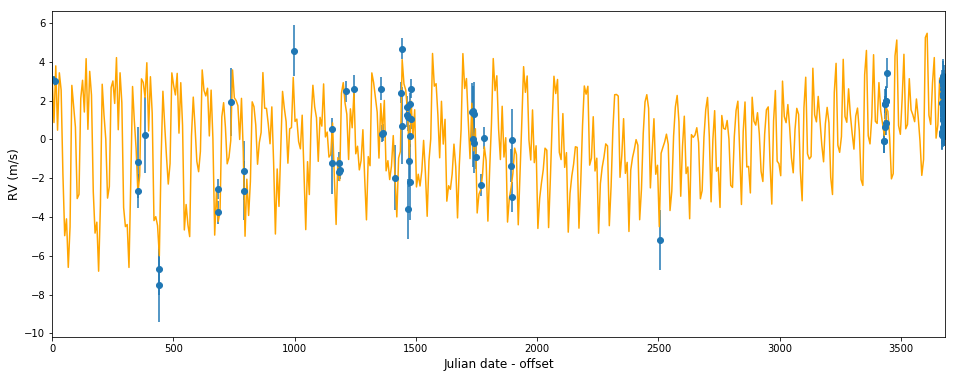

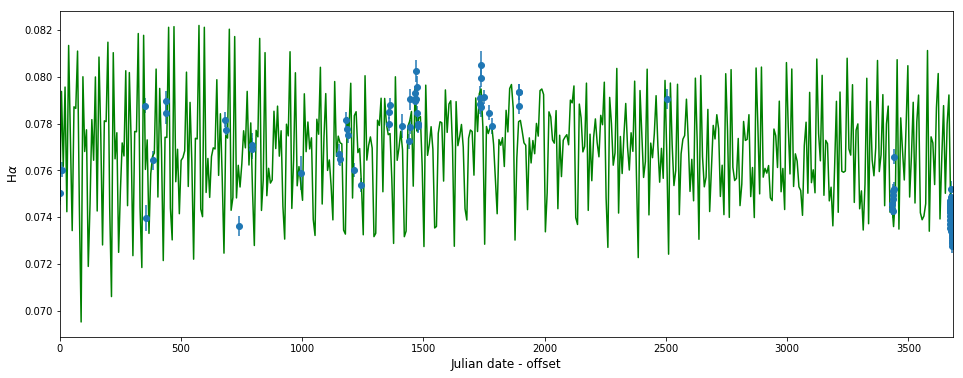

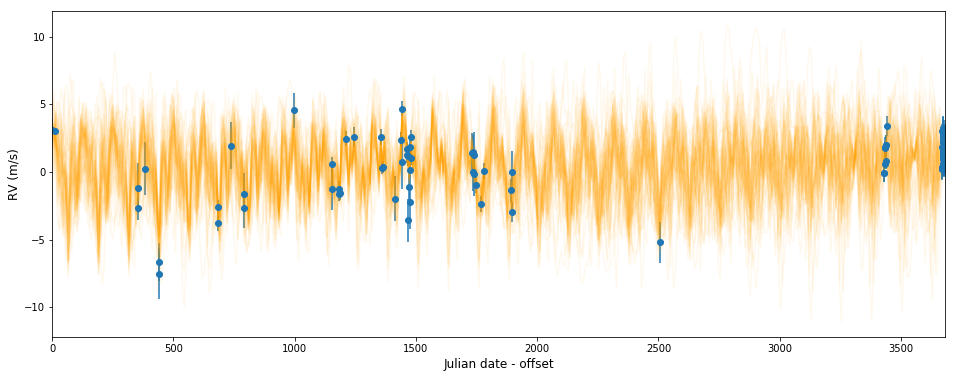

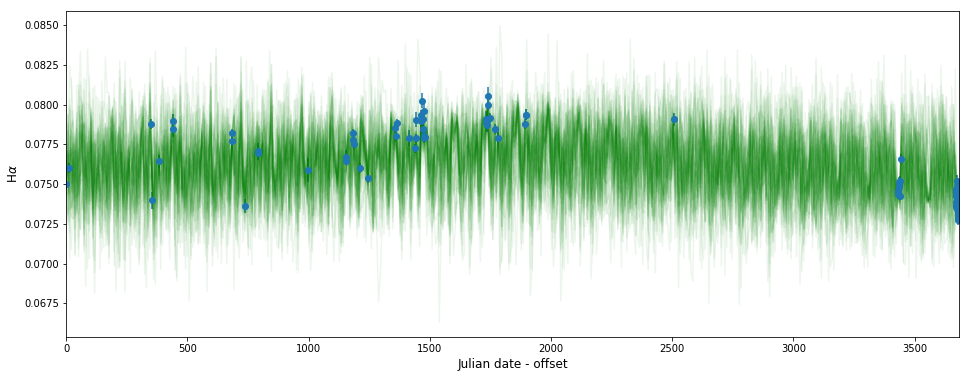

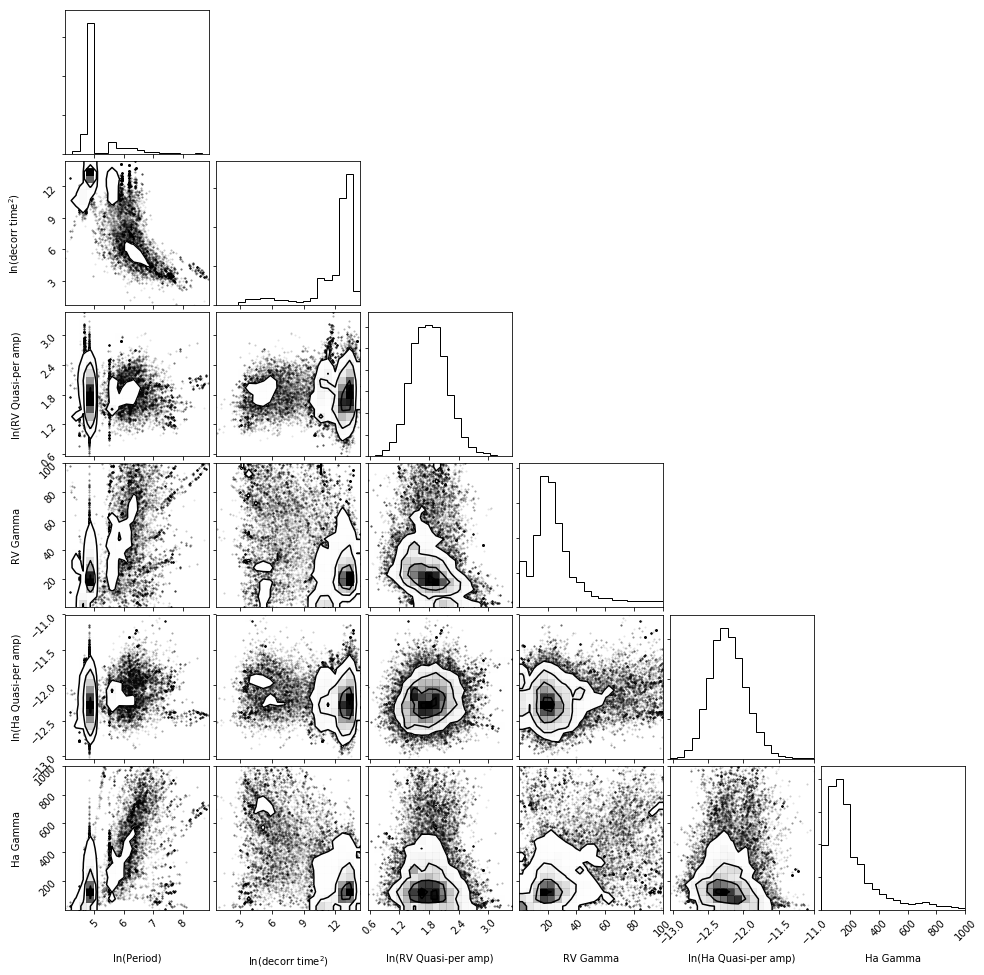

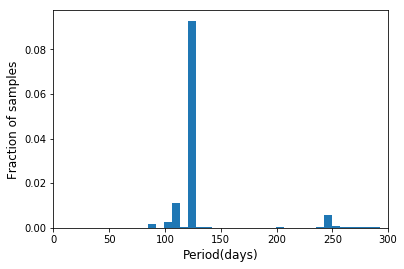

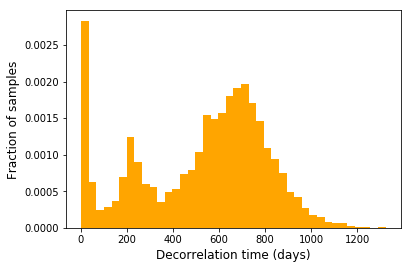

In [42]:
# Make a flat chain of samples with the initial burn-in discarded
samples = sampler.chain[:, nburn:, :].reshape((-1, ndim))

# Plot 50 possible RV curves drawn from the flat chain, along with the data
tt = np.linspace(alldates[0], alldates[-1], 501, endpoint=True)

fig1, (singleRV) = plt.subplots(1,figsize=(16,6))
fig2, (singleha) = plt.subplots(1, figsize=(16,6))
fig3, (RV) = plt.subplots(1, figsize=(16,6))
fig4, (ha) = plt.subplots(1, figsize=(16,6))

for i in range(nwalkers):
    # Choose a sample
    n = np.random.randint(0, samples.shape[0])
    spars_RV, spars_ha = split_par_vec(samples[n])
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    if(i == 0):
        singleRV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange")
        singleha.plot(tt, gp_ha.sample_conditional(allha, tt), "green")   
    # Plot a single sample.
    RV.plot(tt, gp_RV.sample_conditional(allRV, tt), "orange", alpha=0.07)
    ha.plot(tt, gp_ha.sample_conditional(allha, tt), "green", alpha=0.07)
    
# Plot the real data
singleRV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
singleha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
RV.errorbar(alldates, allRV, yerr=allRVerr, fmt='o')
ha.errorbar(alldates, allha, yerr=allhaerr, fmt='o')
singleRV.set_xlim(alldates[0], alldates[-1])
singleha.set_xlim(alldates[0], alldates[-1])
RV.set_xlim(alldates[0], alldates[-1])
ha.set_xlim(alldates[0], alldates[-1])

singleRV.set_xlabel("Julian date - offset", fontsize='large')
singleha.set_xlabel("Julian date - offset", fontsize='large')
RV.set_xlabel("Julian date - offset", fontsize='large')
ha.set_xlabel("Julian date - offset", fontsize='large')
singleRV.set_ylabel("RV (m/s)", fontsize='large')
singleha.set_ylabel(r"H$\alpha$", fontsize='large')
RV.set_ylabel("RV (m/s)", fontsize='large')
ha.set_ylabel(r"H$\alpha$", fontsize='large')

parnames = ["ln(Period)", "ln(decorr time$^2$)", "ln(RV Quasi-per amp)", \
            "RV Gamma", "ln(Ha Quasi-per amp)", "Ha Gamma"]
cfig = corner.corner(samples, labels=parnames)

# Plots
plt.figure()
###Made a change here with adding 500. Sme below
periods = np.exp(samples[:,0])
dctimes = np.exp(0.5*samples[:,1])
n_per, bins_per, _ = plt.hist(periods, 1000, density=True)
plt.xlabel("Period(days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')
plt.xlim([0,300])
##plt.ylim([0,0.07])
plt.figure()
n_dc, bins_dc, _ = plt.hist(dctimes, 40, density=True, facecolor='orange')
plt.xlabel("Decorrelation time (days)", fontsize='large')
plt.ylabel("Fraction of samples", fontsize='large')

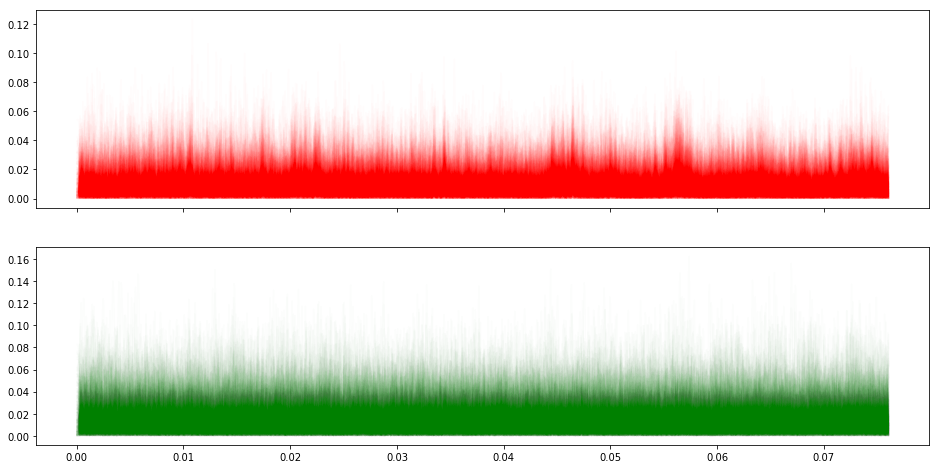

In [43]:
# ##Creating residual plots FIGURE THIS OUT!!
fig5, (ax5, ax6) = plt.subplots(2, sharex=True, figsize=(16,8))
pdsRV = np.zeros(500)
pdsHa = np.zeros(500)

for j in range(500):
    # Choose a sample
    m = np.random.randint(0, (samples.shape[0]))
    gp_RV.set_parameter_vector(spars_RV)
    gp_ha.set_parameter_vector(spars_ha)
    
    #get residuals
    
    residRV = allRV - gp_RV.sample_conditional(allRV, alldates) 
    residHa = allha - gp_ha.sample_conditional(allha, alldates)
                
    #periodogram
    xiRV, pspecRV = LombScargle(alldates, residRV, allRVerr).autopower()
    xiha, pspecha = LombScargle(alldates, residHa, allhaerr).autopower()

    subRV = np.argmax(pspecRV)
    pdsRV[j] = 1.0/xiRV[subRV]
    subHa = np.argmax(pspecha)
    pdsHa[j] = 1.0/xiha[subHa]
    
    ax5.plot(xiRV, pspecRV, 'r-', alpha=0.01)
    ax6.plot(xiha, pspecha, 'g-', alpha=0.01)

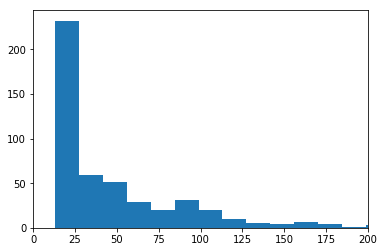

RV residual:  ModeResult(mode=array([21.51990544]), count=array([10]))


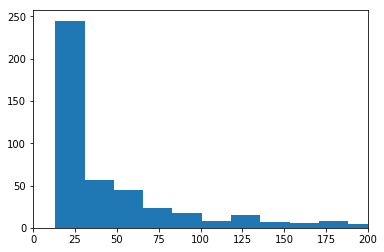

Ha residual:  ModeResult(mode=array([58.91289312]), count=array([4]))


In [44]:
plt.hist(pdsRV, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("RV residual: ", stats.mode(pdsRV))
plt.hist(pdsHa, bins='auto')
plt.xlim(0,200)
plt.show()
plt.close()
print("Ha residual: ", stats.mode(pdsHa))

In [45]:
np.exp(8)

2980.9579870417283

In [46]:
np.log(100)

4.605170185988092

reduced chi^2 = sum(i=1-n) ((yi - mi)^2 / sigmai^2)/(N-(#pars)-1)
m--model
y--data point
sigma--uncertainty